In [37]:
import csv
import time
import warnings
import pickle
import joblib
import json

import numpy as np
import pandas as pd
import matplotlib as mpl
import matplotlib.pyplot as plt
import seaborn as sns

from collections import defaultdict
from pandas.plotting import scatter_matrix
from matplotlib import cm
from matplotlib.colors import ListedColormap

from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
from sklearn import preprocessing
from sklearn.model_selection import train_test_split, RandomizedSearchCV, StratifiedKFold, KFold, GridSearchCV, cross_val_score, cross_validate, ShuffleSplit
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import mean_absolute_error, mean_squared_error, confusion_matrix, r2_score, accuracy_score, f1_score, roc_auc_score, precision_recall_curve, auc, roc_curve, recall_score, precision_score, make_scorer, average_precision_score
from sklearn.ensemble import RandomForestClassifier, RandomForestRegressor
from sklearn.linear_model import LogisticRegression, LinearRegression,Lasso
from sklearn import svm
from sklearn.naive_bayes import GaussianNB
from sklearn.feature_selection import VarianceThreshold, SelectFromModel
from sklearn.neighbors import KNeighborsClassifier
from sklearn import tree
from sklearn.preprocessing import PowerTransformer, OrdinalEncoder, StandardScaler
from sklearn.svm import SVC
from sklearn.feature_selection import SelectKBest, f_regression, RFE


from scipy.stats import pearsonr, ranksums, mannwhitneyu, normaltest, shapiro, boxcox, sem, t
from scipy import stats
from scipy.cluster.hierarchy import linkage, dendrogram, fcluster
from scipy.spatial.distance import squareform
from scipy.optimize import curve_fit
from scipy.stats import ks_2samp

import optuna
import xgboost as xgb
from xgboost import XGBClassifier

import statsmodels.api as sm
from statsmodels.nonparametric.smoothers_lowess import lowess as sm_lowess
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf

from torch.utils.data import DataLoader, TensorDataset
import torch
import torch.nn as nn
import torch.optim as optim

from ctgan import CTGAN
from ctgan.synthesizers.ctgan import Generator
from scipy.spatial.distance import cdist
from IPython.display import Image

mpl.rcParams['figure.dpi'] = 300
%matplotlib inline



In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Using device: {device}")

Using device: cuda


In [3]:
#data imports
data_train_df = pd.read_csv("../paper_analysis/IDT_Reps_BED_BAM_TPFP_Final_01312023.csv")
valid_data_df = pd.read_csv("SangerVariants_VerSamples_IDTProbes_NGS82-VE070_hom0_random200probes_variants.csv")
drop_probe_list = valid_data_df.probe.tolist()
data_train_df = data_train_df[~data_train_df['probe'].isin(drop_probe_list)]


In [4]:
data_apply_df = data_train_df.copy()
data_apply_df = data_apply_df[data_apply_df['eight_and_GIAB'].isna()]
data_apply_df = data_apply_df.fillna(0)


In [5]:
#create the class labels

data_train_df = data_train_df[~data_train_df['eight_and_GIAB'].isna()]
data_train_df = data_train_df.fillna(0)

data_train_df = data_train_df.reset_index(drop=True)
data_train_df['Class'] = data_train_df['eight_and_GIAB'].map({True : 0, False: 1})
data_train_df.Class.value_counts()


0    34625
1     5680
Name: Class, dtype: int64

In [6]:
#balance the data
class_0_df = data_train_df[data_train_df['Class'] == 0]
class_1_df = data_train_df[data_train_df['Class'] == 1]
min_class_size = min(len(class_0_df), len(class_1_df))
class_0_sampled = class_0_df.sample(n=min_class_size, random_state=42)
class_1_sampled = class_1_df.sample(n=min_class_size, random_state=42)
balanced_df = pd.concat([class_0_sampled, class_1_sampled])
balanced_df = balanced_df.sample(frac=1, random_state=42).reset_index(drop=True)
print(balanced_df['Class'].value_counts())

0    5680
1    5680
Name: Class, dtype: int64


In [7]:
#select only number columns and filter by variance threshold


def correlation(dataset, threshold):
    col_corr = set() # Set of all the names of deleted columns
    corr_matrix = dataset.corr()
    for i in range(len(corr_matrix.columns)):
        for j in range(i):
            if (corr_matrix.iloc[i, j] >= threshold) and (corr_matrix.columns[j] not in col_corr):
                colname = corr_matrix.columns[i] # getting the name of column
                col_corr.add(colname)
                if colname in dataset.columns:
                    del dataset[colname] # deleting the column from the dataset

    return dataset

data_only_df = balanced_df.select_dtypes(include=np.number)

cols_to_remove = ['raw_dp_std', 'raw_dp_min', 'raw_dp_median',
                  'normalized_raw_dp_mean', 'normalized_raw_dp_std',
                  'normalized_raw_dp_min', 'normalized_raw_dp_median',
                  'count_mapq_Lt10_std', 'count_mapq_Lt10_min',
                  'count_mapq_Lt10_median', 'pct_count_mapq_Lt10_std','homology_mean', 
                  'homology_min', 'homology_median',
                  'pct_count_mapq_Lt10_min', 'pct_count_mapq_Lt10_median',
                  'homology_std', 'homology_max',"NGS82_Homolgy_Probes_V2.PO",
                  "NGS82_Homolgy_Probes_V2.RPO",
                  "proper_pair_std", "proper_pair_mean",  "proper_pair_min",
                  "isize_min", "mm-2-merged-complement.PO", 'isize_mean', 'isize_median', 'isize_std',
                  "mm-2-merged-complement.RPO",'mm-2-merged.PO', 'mm-2-merged.RPO',
                 'isize_max', 'AS_max', 'MQ_max', 'normalized_raw_dp_max', 'count_mapq_Lt10_max']

data_only_df = data_only_df.drop(cols_to_remove, axis=1)
var_thr = VarianceThreshold(threshold=0.05)
data_only_filtered_df = data_only_df.loc[:, var_thr.fit(data_only_df).get_support()]
labels = data_only_filtered_df['Class']
data_cols_df = data_only_filtered_df.drop(columns=['Class'])
data_filtered_df = correlation(data_cols_df, 0.9)
model_cols = data_filtered_df.columns
data_filtered_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11360 entries, 0 to 11359
Data columns (total 58 columns):
 #   Column                                                  Non-Null Count  Dtype  
---  ------                                                  --------------  -----  
 0   MAPQ_mean                                               11360 non-null  float64
 1   MAPQ_std                                                11360 non-null  float64
 2   AS_mean                                                 11360 non-null  float64
 3   AS_std                                                  11360 non-null  float64
 4   XS_mean                                                 11360 non-null  float64
 5   XS_std                                                  11360 non-null  float64
 6   MQ_std                                                  11360 non-null  float64
 7   raw_dp                                                  11360 non-null  float64
 8   count_mapq_Lt10                     

In [8]:
name_change_dict = {'GRCh37_SimpleRepeat_homopolymer_7to11_slop5.RPO' : "NIST_SR_HP_7t11_slop5.RPO",
       'GRCh37_notinsegdups.PO':"NIST_notSD.PO",
       'GRCh37_AllTandemRepeatsandHomopolymers_slop5.RPO':"NIST_ATRH_slop5.RPO",
       'hg19_self_chain_split_both.PO': "NIST_SCSB.PO",
       'AllRepeats_lt51bptandemrepeats_gt95identity_merged_slop5.RPO': "AR_lt51TB_gt95_slop5.PRO",
       'human_g1k_v37_l100_gc55to60_slop50.PO':"gc55to60_slop50.PO",
       'human_g1k_v37_l100_gclt30orgt55_slop50.PO': "gclt30orgt55_slop50.PO",
       'GRCh37_notinlowmappabilityall.PO': "NIST_notinLM.PO",
        'GRCh37_gc65to70_slop50.PO': "NIST_gc65to70_slop50.PO",
       'siren_similarRegions_dist1.PO': "Siren.PO", 
       'human_g1k_v37_l100_gclt25orgt65_slop50.PO': "gclt25orgt65_slop50.PO",
       'GRCh37_notinAllTandemRepeatsandHomopolymers_slop5.PO': "NIST_NIATRH_slop5.PO", 
       'GRCh37_alldifficultregions.PO': "NIST_alldifficultregions.PO",
       'GRCh37_alldifficultregions.RPO': "NIST_alldifficultregions.RPO",
       'GRCh37_notinalllowmapandsegdupregions.PO': "NIST_NIALMSDR.PO", 
       'refseq_union_cds_no_anno.PO': "refseq_CDS.PO",
        'refseq_union_cds_no_anno.RPO': "refseq_CDS.RPO",
       'GRCh37_SimpleRepeat_homopolymer_4to6_slop5.RPO': "NIST_SRH4to6_slop5.RPO",
       'GRCh37_chainSelf_gt10kb.PO': "NIST_chain_gt10KB.PO",
        'SimpleRepeat_homopolymer_6to10.RPO': "SR_HP_6to10.RPO",
       'hg19_self_chain_split_both_gt10k.PO': "hg19_SCSB_gt10K.PO",
        'GRCh37_gclt25orgt65_slop50.PO': "NIST_gclt25orgt65_slop50.PO",
       'SimpleRepeat_imperfecthomopolgt10_slop5.RPO': "SR_Ihpgt10_slop5.RPO",
       'GRCh37_AllHomopolymers_gt6bp_imperfectgt10bp_slop5.RPO': "NIST_Ahp_gt6_igt10bp_splop5.RRO",
       'GRCh37_notinalldifficultregions.PO': "NIST_naDiffreg.PO",
       'human_g1k_v37_l100_gc30to55_slop50.PO': "gc30to55_slop50.PO",
       'GRCh37_gclt30orgt55_slop50.PO': "NIST_gclt30orgt55_slop50.PO",
       'human_g1k_v37_l100_gc65to70_slop50.PO' : "gc65to70_slop50.PO",
       'GRCh37_alllowmapandsegdupregions.PO': "NIST_LowSegDupReg.PO",
       'hg19_self_chain_split_withalts_gt10k.PO': "split_withalts_gt10k.PO",
       'notinAllRepeats_gt95percidentity_slop5.PO': "NotinRep_gt95_slop5.PO",
       'AllRepeats_gt95percidentity_slop5.RPO': "AllRep_gt95iden_slop5.RPO",
       'AllRepeats_lt51bp_gt95identity_merged_slop5.RPO': "AllRep_lt51_gt95iden_slop5.RPO",
       'AllRepeats_lt51bp_gt95identity_merged.RPO': "AllRep_lt51_gt95iden.RPO",
       'AllRepeats_lt51bptandemrepeats_gt95identity_merged.RPO': "AllRep_lt51tandemgt95.RPO",
       'human_g1k_v37_l100_gc60to65_slop50.PO': "gc60to65_slop50.PO", 
       'GRCh37_SimpleRepeat_imperfecthomopolgt10_slop5.RPO': "NIST_SR_impHomo10_slop5.RPO",
        'GRCh37_allOtherDifficultregions.PO': 'NIST_allOthDiffReg.PO',
        'human_g1k_v37_gemmap_l150_m2_e1_nonuniq.PO': 'gen_l150_m2_e1_nonuniq.PO', 
        'GRCh37_AllTandemRepeats_gt100bp_slop5.PO': "NIST_ATRep_gt100bp_slop5.PO",
        'human_g1k_v37_gemmap_l150_m1_e0_nonuniq.PO': 'gen_l150_m1_e0_nonuniq.PO',
        'GRCh37_AllTandemRepeatsandHomopolymers_slop5.PO':'NIST_ATrepHomo_slop5.PO',
        'human_g1k_v37_gemmap_l100_m1_e0_nonuniq.PO': 'gen_l100_m1_e0_nonuniq.PO',
        'human_g1k_v37_gemmap_l250_m1_e0_nonuniq.PO': 'gen_l250_m1_e0_nonuniq.PO',
         'Human_Full_Genome_TRDB_hg19_150331_all_merged.PO':'hg19_150331_all_merged.PO', 
        'human_g1k_v37_gemmap_l100_m0_e0_nonuniq.PO':"gen_l100_m0_e0_nonuniq.PO",
        'GRCh37_SimpleRepeat_homopolymer_gt11_slop5.RPO':'NIST_SRhomogt11_slop5.RPO',
        'human_g1k_v37_gemmap_l150_m2_e0_nonuniq.PO':'gen_l150_m2_e0_nonuniq.PO',
        'human_g1k_v37_gemmap_l250_m2_e1_nonuniq.PO':'gen_l250_m2_e1_nonuniq.PO',
        'human_g1k_v37_gemmap_l100_m2_e1_nonuniq.PO':"gen_l100_m2_e1_nonuniq.PO",
         'human_g1k_v37_gemmap_l100_m2_e0_nonuniq.PO':"gen_l100_m2_e0_nonuniq.PO",
        'human_g1k_v37_gemmap_l125_m2_e0_nonuniq.PO':"gen_l125_m2_e0_nonuniq.PO",
        'human_g1k_v37_gemmap_l125_m0_e0_nonuniq.PO':'gen_l125_m0_e0_nonuniq.PO',
        'human_g1k_v37_gemmap_l250_m2_e0_nonuniq.PO':'gen_l250_m2_e0_nonuniq.PO',
        'human_g1k_v37_gemmap_l150_m0_e0_nonuniq.PO':"gen_l150_m0_e0_nonuniq.PO",
        'human_g1k_v37_gemmap_l125_m2_e1_nonuniq.PO':'gen_l125_m2_e1_nonuniq.PO',
        'human_g1k_v37_gemmap_l125_m1_e0_nonuniq.PO':'gen_l125_m1_e0_nonuniq.PO'
                   }


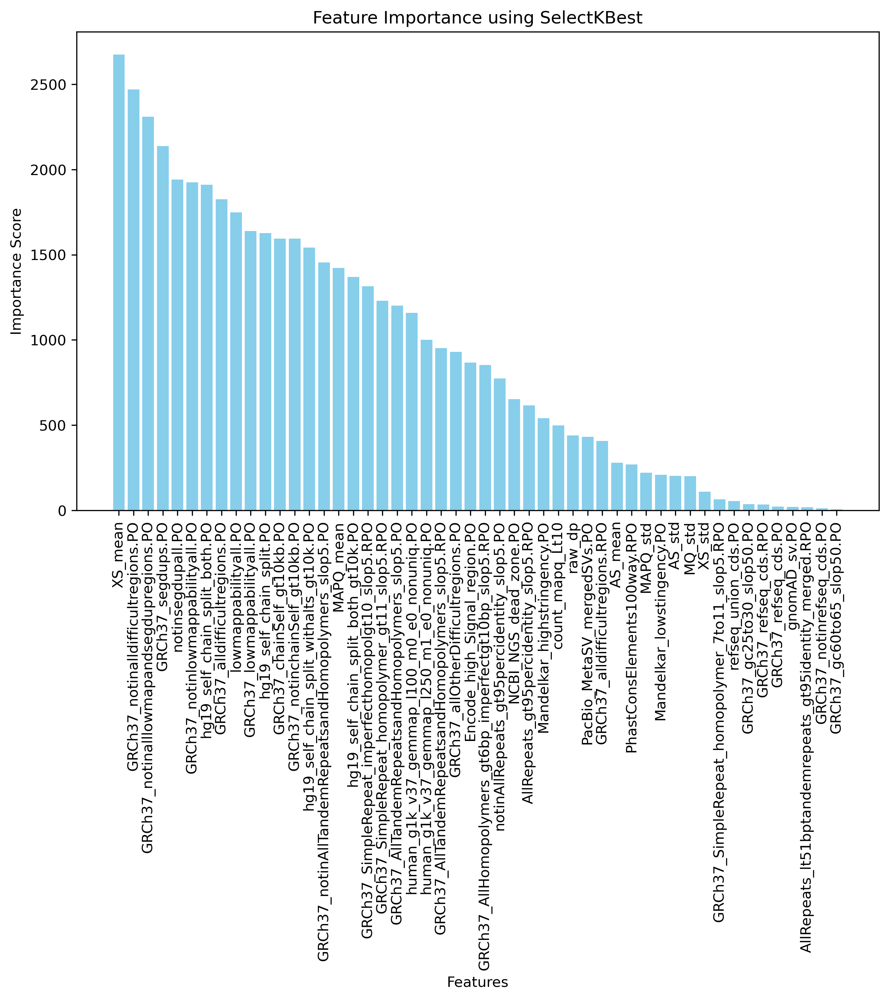

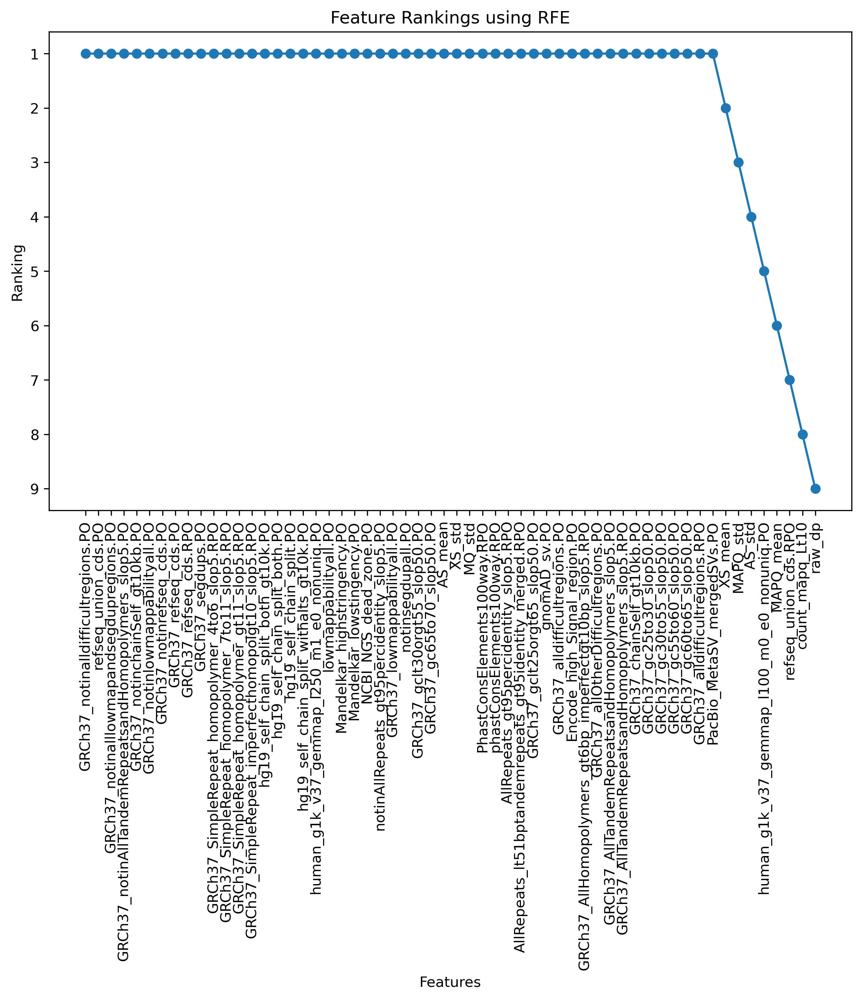

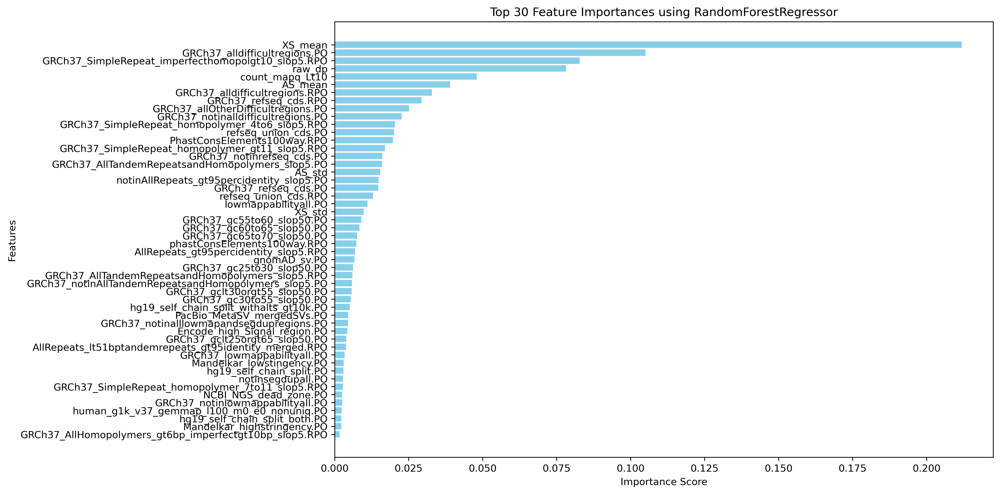

In [9]:


X = data_filtered_df
y = labels

selector_unvi = SelectKBest(score_func=f_regression, k=50)
X_new = selector_unvi.fit_transform(X, y)
feature_indices = selector_unvi.get_support(indices=True)
features_selected = data_filtered_df.columns[feature_indices]
scores = selector_unvi.scores_

selected_features_scores = {feature: scores[idx] for feature, idx in zip(features_selected, feature_indices)}

# Convert the selected features and their scores to a pandas DataFrame for easier plotting
selected_features_df = pd.DataFrame(list(selected_features_scores.items()), columns=['Feature', 'Score'])
selected_features_df = selected_features_df.sort_values(by='Score', ascending=False)

plt.figure(figsize=(10, 6))
plt.bar(selected_features_df['Feature'], selected_features_df['Score'], color='skyblue')
plt.xlabel('Features')
plt.ylabel('Importance Score')
plt.title('Feature Importance using SelectKBest')
plt.xticks(rotation=90)
plt.show()

estimator = LinearRegression()
selector_RFE =  RFE(estimator, n_features_to_select=50)
x_new_RFE = selector_RFE.fit_transform(X, y)
feature_indices_RFE = selector_unvi.get_support(indices=True)
features_selected_RFE = data_filtered_df.columns[feature_indices_RFE]
rankings = selector_RFE.ranking_

# Create a DataFrame for features and their rankings
rankings_df = pd.DataFrame({
    'Feature': data_filtered_df.columns,
    'Ranking': rankings
})

# Sort the DataFrame by rankings
rankings_df_sorted = rankings_df.sort_values(by='Ranking')

plt.figure(figsize=(10, 6))
plt.plot(rankings_df_sorted['Feature'], rankings_df_sorted['Ranking'], marker='o', linestyle='-')
plt.xlabel('Features')
plt.ylabel('Ranking')
plt.title('Feature Rankings using RFE')
plt.xticks(rotation=90)
plt.gca().invert_yaxis()  # Invert y-axis to show the most important features at the top
plt.show()

forest = RandomForestRegressor(n_estimators=100)
forest.fit(X,y)
importances = forest.feature_importances_
top_indexes = importances.argsort()[::-1]
k=50
top_importances = importances[top_indexes[:k]]
top_importances
top_features = data_filtered_df.columns[top_indexes[:k]]

# Create a DataFrame for top features and their importances
top_features_df = pd.DataFrame({
    'Feature': top_features,
    'Importance': top_importances
})

# Plot the top 30 features
plt.figure(figsize=(12, 8))
plt.barh(top_features_df['Feature'], top_features_df['Importance'], color='skyblue')
plt.xlabel('Importance Score')
plt.ylabel('Features')
plt.title('Top 30 Feature Importances using RandomForestRegressor')
plt.gca().invert_yaxis()  # Invert y-axis to show the most important features at the top
plt.show()

In [10]:
rankings_df_sorted['Method'] = 'Linear Regression'
rankings_df_sorted = rankings_df_sorted.reset_index(drop=True)
rankings_df_sorted['LR_Rank'] = rankings_df_sorted.index + 1
rankings_df_sorted

def create_categories(x):
    if x <= 5:
        return 1
    elif 6 <= x < 10:
        return 2
    elif 10 <= x < 15:
        return 3
    elif 15 <= x < 20:
        return 4
    elif 20 <= x < 25:
        return 5
    elif 25 <= x < 30:
        return 6
    else:
        return 7

rankings_df_sorted['LinearRegression'] = rankings_df_sorted['LR_Rank'].apply(create_categories)
rankings_df_sorted_final_df = rankings_df_sorted[['Feature', 'LinearRegression']]
rankings_df_sorted_final_df

,Feature,LinearRegression
0,GRCh37_notinalldifficultregions.PO,1
1,refseq_union_cds.PO,1
2,GRCh37_notinalllowmapandsegdupregions.PO,1
3,GRCh37_notinAllTandemRepeatsandHomopolymers_sl...,1
4,GRCh37_notinchainSelf_gt10kb.PO,1
5,GRCh37_notinlowmappabilityall.PO,2
6,GRCh37_notinrefseq_cds.PO,2
7,GRCh37_refseq_cds.PO,2
8,GRCh37_refseq_cds.RPO,2
9,GRCh37_segdups.PO,3


In [11]:
top_features_df['method'] = 'RandomForestRegressor'
top_features_df['RF_Rank'] = top_features_df.index + 1
selected_features_df['method'] = 'SelectKBest'
selected_features_rank_df = selected_features_df.copy()
selected_features_rank_df = selected_features_rank_df.reset_index(drop=True)
selected_features_rank_df['SKB_Rank'] = selected_features_rank_df.index + 1
selected_features_rank_df['SelectKBest'] = selected_features_rank_df['SKB_Rank'].apply(create_categories)
selected_features_rank_final_df = selected_features_rank_df[['Feature', 'SelectKBest']]
top_features_df['RandomForestRegressor'] = top_features_df['RF_Rank'].apply(create_categories)
top_features_final_df = top_features_df[['Feature', 'RandomForestRegressor']]
selected_features_rank_final_df


feature_select_matrix_df = pd.merge(rankings_df_sorted_final_df, selected_features_rank_final_df, on='Feature', how='left')
feature_select_matrix_df = pd.merge(feature_select_matrix_df, top_features_final_df, on='Feature', how='left')
feature_select_matrix_df = feature_select_matrix_df.fillna(7)
feature_select_matrix_df['LinearRegression'] = feature_select_matrix_df['LinearRegression'].astype(int)
feature_select_matrix_df['SelectKBest'] = feature_select_matrix_df['SelectKBest'].astype(int)
feature_select_matrix_df['RandomForestRegressor'] = feature_select_matrix_df['RandomForestRegressor'].astype(int)
#feature_select_matrix_df = feature_select_matrix_df[((feature_select_matrix_df['LR_Rank_category'] != 0) & 
#                                   (feature_select_matrix_df['RF_Rank_category'] != 0))]


feature_select_matrix_filtered_df = feature_select_matrix_df[(feature_select_matrix_df['LinearRegression'] < 5) | (feature_select_matrix_df['SelectKBest']< 5) | (feature_select_matrix_df['RandomForestRegressor'] < 5)]
feature_select_matrix_filtered_df

feature_select_matrix_trans_df = feature_select_matrix_filtered_df.T
feature_select_matrix_trans_df.columns = feature_select_matrix_trans_df.iloc[0]
feature_select_matrix_trans_df = feature_select_matrix_trans_df[1:]
feature_select_matrix_filtered_df.to_csv("feature_category_data.csv",index=None)

In [12]:
df = feature_select_matrix_trans_df.copy()

#df =df.reset_index()
df.columns

Index(['GRCh37_notinalldifficultregions.PO', 'refseq_union_cds.PO',
       'GRCh37_notinalllowmapandsegdupregions.PO',
       'GRCh37_notinAllTandemRepeatsandHomopolymers_slop5.PO',
       'GRCh37_notinchainSelf_gt10kb.PO', 'GRCh37_notinlowmappabilityall.PO',
       'GRCh37_notinrefseq_cds.PO', 'GRCh37_refseq_cds.PO',
       'GRCh37_refseq_cds.RPO', 'GRCh37_segdups.PO',
       'GRCh37_SimpleRepeat_homopolymer_4to6_slop5.RPO',
       'GRCh37_SimpleRepeat_homopolymer_7to11_slop5.RPO',
       'GRCh37_SimpleRepeat_homopolymer_gt11_slop5.RPO',
       'GRCh37_SimpleRepeat_imperfecthomopolgt10_slop5.RPO',
       'hg19_self_chain_split_both_gt10k.PO', 'hg19_self_chain_split_both.PO',
       'hg19_self_chain_split.PO', 'hg19_self_chain_split_withalts_gt10k.PO',
       'human_g1k_v37_gemmap_l250_m1_e0_nonuniq.PO', 'lowmappabilityall.PO',
       'notinAllRepeats_gt95percidentity_slop5.PO',
       'GRCh37_lowmappabilityall.PO', 'notinsegdupall.PO', 'AS_mean',
       'PhastConsElements100way.RPO', 

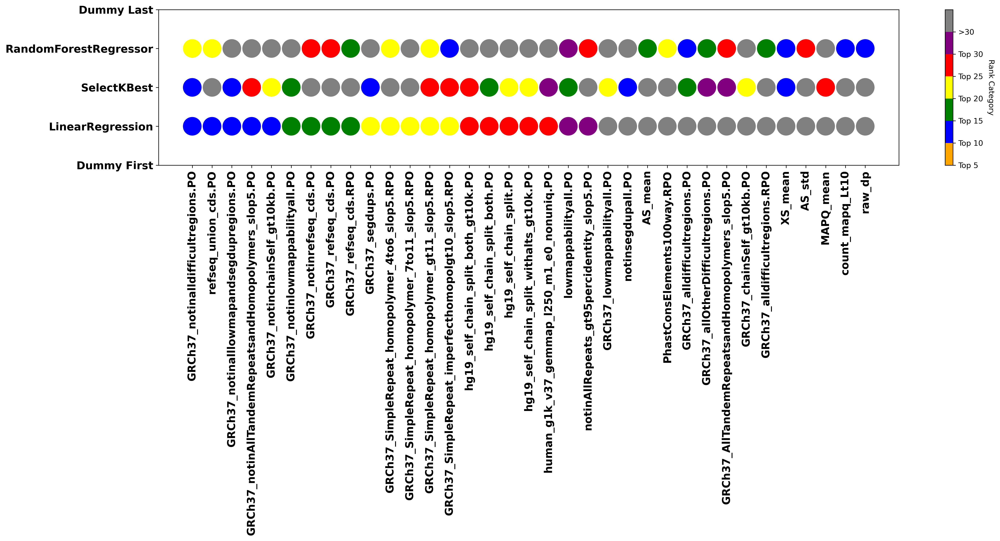

In [26]:
dummy_first_row = pd.Series(np.nan, index=df.columns, name='Dummy First')
dummy_last_row = pd.Series(np.nan, index=df.columns, name='Dummy Last')
df = pd.concat([dummy_first_row.to_frame().T, df, dummy_last_row.to_frame().T])

# Define colors and colormap
colors = ['orange', 'blue', 'green', 'yellow', 'red', 'purple', 'grey']
cmap = ListedColormap(colors)
plt.figure(figsize=(20, 10))
# Create a scatter plot with adjusted parameters
for i, col in enumerate(df.columns):
    plt.scatter(
        x=[col] * df.shape[0],
        y=df.index,
        c=df[col],
        s=600,  # Adjusted circle size
        cmap=cmap,
        vmin=0,
        vmax=len(colors) -1 ,
        edgecolor='none',  # Remove the edge color
        linewidth=0  # Set linewidth to 0 to remove borders
    )

# Add color bar with categorical ticks
norm = plt.Normalize(vmin=0, vmax=len(colors))
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks=np.arange(len(colors)))
cbar.set_label('Rank Category', rotation=270, labelpad=15)
cbar.set_ticklabels(['Top 5', 'Top 10', 'Top 15', 'Top 20', 'Top 25', 'Top 30', ">30"])

# Adjust the plot
plt.gca().set_ylim('Dummy Last', 'Dummy First')  # Set y-axis limits excluding dummy rows
plt.gca().invert_yaxis()  # Invert y-axis to start from top
plt.xticks(rotation=90)
plt.xticks(fontsize=14, rotation=90, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')
plt.tight_layout()  # Ensures all elements fit nicely in the figure

plt.show()


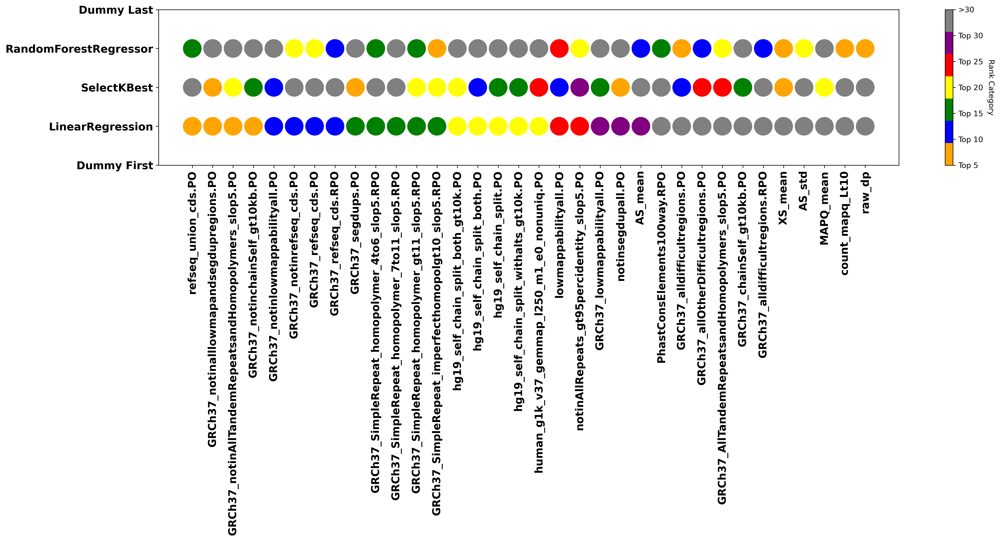

In [28]:
# Create the scatter plot
plt.figure(figsize=(20, 10))

for i, col in enumerate(df.columns[1:]):  # Exclude 'Feature' column
    plt.scatter(
        x=[col] * df.shape[0],
        y=df.index,
        c=df[col],
        s=600,  # Adjusted circle size
        cmap=cmap,
        vmin=1,  # Minimum rank value
        vmax=7,  # Maximum rank value
        edgecolor='none',  # Remove the edge color
        linewidth=0  # Set linewidth to 0 to remove borders
    )

# Add color bar with categorical ticks
norm = plt.Normalize(vmin=1, vmax=7)
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = plt.colorbar(sm, ticks=np.arange(1, 8))
cbar.set_label('Rank Category', rotation=270, labelpad=15)
cbar.set_ticklabels(['Top 5', 'Top 10', 'Top 15', 'Top 20', 'Top 25', 'Top 30', ">30"])

# Adjust the plot
#plt.gca().set_ylim(len(df)-1, 0)  # Set y-axis limits excluding dummy rows
plt.gca().set_ylim('Dummy Last', 'Dummy First')
plt.gca().invert_yaxis()  # Invert y-axis to start from top
plt.xticks(range(len(df.columns[1:])), df.columns[1:], fontsize=14, rotation=90, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')
plt.tight_layout()  # Ensures all elements fit nicely in the figure
plt.savefig('naive_votting_features_selection.png', dpi=300)
plt.show()

In [14]:
top_features_select_df = pd.merge(rankings_df_sorted, top_features_df, on='Feature')
top_features_select_df = pd.merge(top_features_select_df, selected_features_df, on='Feature')
features_to_keep = top_features_select_df.Feature.tolist()

features_to_keep = ['GRCh37_notinalldifficultregions.PO', 'refseq_union_cds.PO',
       'GRCh37_notinalllowmapandsegdupregions.PO',
       'GRCh37_notinAllTandemRepeatsandHomopolymers_slop5.PO',
       'GRCh37_notinchainSelf_gt10kb.PO', 'GRCh37_notinlowmappabilityall.PO',
       'GRCh37_notinrefseq_cds.PO', 'GRCh37_refseq_cds.PO',
       'GRCh37_refseq_cds.RPO', 'GRCh37_segdups.PO',
       'GRCh37_SimpleRepeat_homopolymer_4to6_slop5.RPO',
       'GRCh37_SimpleRepeat_homopolymer_7to11_slop5.RPO',
       'GRCh37_SimpleRepeat_homopolymer_gt11_slop5.RPO',
       'GRCh37_SimpleRepeat_imperfecthomopolgt10_slop5.RPO',
       'hg19_self_chain_split_both_gt10k.PO', 'hg19_self_chain_split_both.PO',
       'hg19_self_chain_split.PO', 'hg19_self_chain_split_withalts_gt10k.PO',
       'human_g1k_v37_gemmap_l250_m1_e0_nonuniq.PO', 'lowmappabilityall.PO',
       'notinAllRepeats_gt95percidentity_slop5.PO',
       'GRCh37_lowmappabilityall.PO', 'notinsegdupall.PO', 'AS_mean',
       'PhastConsElements100way.RPO', 'GRCh37_alldifficultregions.PO',
       'GRCh37_allOtherDifficultregions.PO',
       'GRCh37_AllTandemRepeatsandHomopolymers_slop5.PO',
       'GRCh37_chainSelf_gt10kb.PO', 'GRCh37_alldifficultregions.RPO',
       'XS_mean', 'AS_std', 'MAPQ_mean', 'count_mapq_Lt10', 'raw_dp']

data_filtered_df = data_filtered_df[features_to_keep]
data_filtered_labels_df = data_filtered_df.copy()
data_filtered_labels_df['labels'] = labels
data_filtered_labels_df

,GRCh37_notinalldifficultregions.PO,refseq_union_cds.PO,GRCh37_notinalllowmapandsegdupregions.PO,GRCh37_notinAllTandemRepeatsandHomopolymers_slop5.PO,GRCh37_notinchainSelf_gt10kb.PO,GRCh37_notinlowmappabilityall.PO,GRCh37_notinrefseq_cds.PO,GRCh37_refseq_cds.PO,GRCh37_refseq_cds.RPO,GRCh37_segdups.PO,...,GRCh37_allOtherDifficultregions.PO,GRCh37_AllTandemRepeatsandHomopolymers_slop5.PO,GRCh37_chainSelf_gt10kb.PO,GRCh37_alldifficultregions.RPO,XS_mean,AS_std,MAPQ_mean,count_mapq_Lt10,raw_dp,labels
0,1.000,0.000,1.0,1.000,1.0,1.0,0.000,1.000,0.126,0.0,...,0.0,0.000,0.0,0.000,21.000000,1.443376,60.0,0.000000,750.666667,0
1,0.742,0.425,1.0,0.742,1.0,1.0,0.292,0.417,1.000,0.0,...,0.0,0.258,0.0,0.554,20.666667,0.000000,60.0,0.000000,157.000000,1
2,0.000,0.900,1.0,1.000,1.0,1.0,0.108,0.892,0.146,0.0,...,0.0,0.000,0.0,0.395,19.000000,0.000000,60.0,0.666667,636.000000,0
3,1.000,0.792,1.0,1.000,1.0,1.0,0.217,0.783,0.500,0.0,...,0.0,0.000,0.0,0.000,20.000000,0.000000,60.0,0.666667,977.000000,0
4,1.000,0.850,1.0,1.000,1.0,1.0,0.158,0.842,0.500,0.0,...,0.0,0.000,0.0,0.000,19.000000,2.516611,60.0,0.333333,568.000000,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11355,0.296,0.550,1.0,0.296,1.0,1.0,0.450,0.550,0.508,0.0,...,0.0,0.408,0.0,1.000,34.000000,0.000000,60.0,1.000000,1779.666667,1
11356,1.000,0.000,1.0,1.000,1.0,1.0,0.279,0.442,1.000,0.0,...,0.0,0.000,0.0,0.000,19.000000,2.886751,60.0,0.333333,635.666667,0
11357,0.000,1.000,1.0,1.000,1.0,1.0,0.000,1.000,0.280,0.0,...,0.0,0.000,0.0,0.195,0.000000,4.509250,60.0,4.000000,756.000000,0
11358,1.000,0.517,1.0,1.000,1.0,1.0,0.483,0.517,0.504,0.0,...,0.0,0.000,0.0,0.000,19.000000,0.000000,60.0,0.000000,457.333333,0


In [16]:

results_list = []
def objective(trial):
    # Define hyperparameters to tune
    discriminator_lr = trial.suggest_loguniform('discriminator_lr', 1e-5, 1e-3)
    generator_lr = trial.suggest_loguniform('generator_lr', 1e-5, 1e-3)
    embedding_dim = trial.suggest_categorical('embedding_dim', [128, 256, 512])
    generator_dim = trial.suggest_categorical('generator_dim', [(256, 256), (512, 512), (256, 512)])
    discriminator_dim = trial.suggest_categorical('discriminator_dim', [(256, 256), (512, 512), (256, 512)])
    discriminator_steps = trial.suggest_int('discriminator_steps', 1, 10)
    batch_size = trial.suggest_categorical('batch_size', [100, 300, 500])
    #epochs = trial.suggest_int('epochs', 200, 500)  # Adding epochs to the search space
    
    # Initialize CTGAN with the suggested hyperparameters
    ctgan = CTGAN(
        discriminator_lr=discriminator_lr,
        generator_lr=generator_lr,
        embedding_dim=embedding_dim,
        generator_dim=generator_dim,
        discriminator_dim=discriminator_dim,
        discriminator_steps=discriminator_steps,
        batch_size=batch_size,cuda=True,
        verbose=True
    )
    # Train the CTGAN model
    categorical_features = ['labels']
    ctgan.fit(data_filtered_labels_df, categorical_features, epochs=50)
    
    # Generate synthetic data
    synthetic_data = ctgan.sample(len(data_filtered_labels_df))
    
    # Evaluate the similarity using the Kolmogorov-Smirnov test for each feature
    results = []
    for feature in data_filtered_df.columns:
        if feature in categorical_features:
            # For categorical features, use Chi-square test or similar
            observed = data_filtered_df[feature].value_counts()
            expected = synthetic_data[feature].value_counts()
            # Normalize the counts to probabilities
            observed = observed / observed.sum()
            expected = expected / expected.sum()
            # Align the indices
            expected = expected.reindex(observed.index, fill_value=0)
            chi2_stat = ((observed - expected) ** 2 / expected).sum()
            results.append(chi2_stat)
        else:
            # For numerical features, use the KS test
            ks_stat, p_value = ks_2samp(data_filtered_df[feature], synthetic_data[feature])
            results.append(ks_stat)
    
    aggregate_score = np.mean(results)
    print(aggregate_score)

    # Save the results
    trial_result = trial.params
    trial_result['ks_stat'] = aggregate_score
    results_list.append(trial_result)

    return aggregate_score

# Create the Optuna study and optimize
#study = optuna.create_study(direction='minimize')
#study.optimize(objective, n_trials=50)

# Save the best hyperparameters
#best_params = study.best_trial.params
#print("Best parameters found: ", best_params)

# Save the study
#joblib.dump(study, "ctgan_optuna_study.pkl")

# Create a DataFrame from the results
#results_df = pd.DataFrame(results_list)
#print(results_df)

# Save the DataFrame to a CSV file
#results_df.to_csv("hyperparameter_optimization_results.csv", index=False)


In [17]:
ctgan = CTGAN(discriminator_lr=0.00018087686838339368, generator_lr=1.5436170561071176e-05, embedding_dim=256, 
              generator_dim=(512, 512), discriminator_dim=(512, 512), discriminator_steps=6, batch_size=300, cuda=True,
              verbose=True)
#help(ctgan)
categorical_features = ['labels']

# Fit the model to your data (assuming data_filtered_df is your dataset)
ctgan.fit(data_filtered_labels_df, categorical_features, epochs=1000)


Gen. (0.00) | Discrim. (0.00):   0%|                                                               | 0/1000 [00:00<?, ?it/s]/projects/wangc/rohan/miniconda3/envs/thesis/lib/python3.9/site-packages/torch/autograd/graph.py:744: UserWarning: Attempting to run cuBLAS, but there was no current CUDA context! Attempting to set the primary context... (Triggered internally at ../aten/src/ATen/cuda/CublasHandlePool.cpp:135.)
  return Variable._execution_engine.run_backward(  # Calls into the C++ engine to run the backward pass
Gen. (-2.83) | Discrim. (-1.13): 100%|████████████████████████████████████████████████| 1000/1000 [1:51:56<00:00,  6.72s/it]


In [19]:
ctgan_loss_df = ctgan.loss_values
ctgan_loss_df.to_csv("ctgan_loss_data.hpo.csv", index=None)
ctgan_loss_df.columns = ['epochs', 'generator_loss', 'discriminator_loss']

     epochs  generator_loss  discriminator_loss
0         0       -0.365471          -12.338779
1         1       -2.552868           -9.540003
2         2       -4.270743           -6.483751
3         3       -5.137998           -3.616733
4         4       -5.346026           -1.953732
..      ...             ...                 ...
995     995       -3.763629           -0.281999
996     996       -3.025133           -0.404888
997     997       -2.870681           -0.072417
998     998       -3.349341           -0.568367
999     999       -2.826544           -1.133179

[1000 rows x 3 columns]


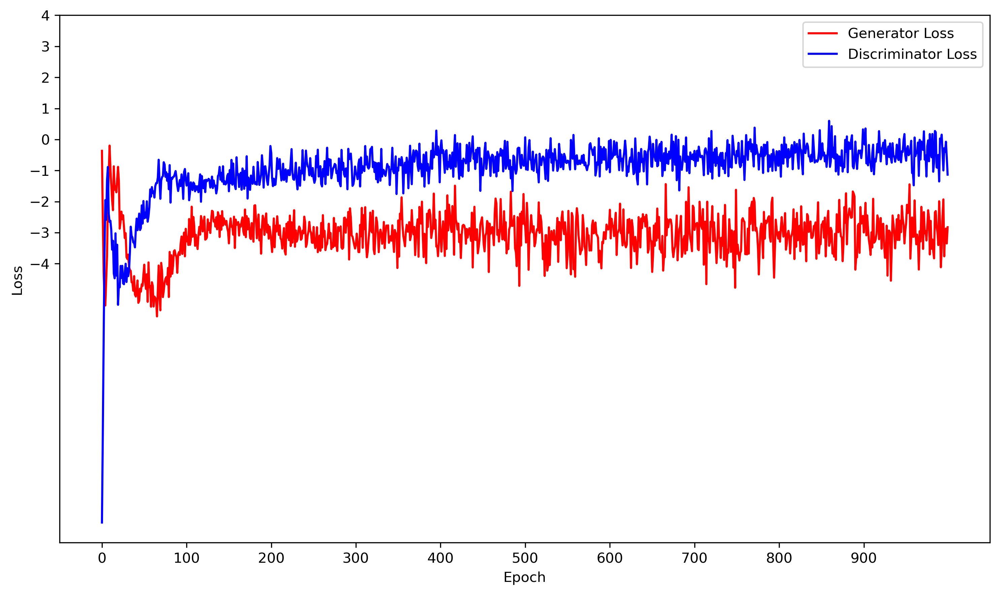

In [15]:
ctgan_loss_df = pd.read_csv('ctgan_loss_data.hpo.csv')
print(ctgan_loss_df)
ctgan_loss_df.columns = ['epochs', 'generator_loss', 'discriminator_loss']
plt.figure(figsize=(10, 6))

# Generator Loss plot
plt.plot(ctgan_loss_df.epochs, ctgan_loss_df.generator_loss, label='Generator Loss', color='red')

# Discriminator Loss plot
plt.plot(ctgan_loss_df.epochs, ctgan_loss_df.discriminator_loss, label='Discriminator Loss', color='blue')

# Adding labels and title

plt.xlabel('Epoch')
plt.ylabel('Loss')


spacing = max(1, len(ctgan_loss_df.epochs) // 10)  # Adjust this value as needed
xticks_positions = np.arange(0, len(ctgan_loss_df.epochs), spacing)

plt.xticks(xticks_positions)
plt.yticks([-4.0, -3.0, -2.0,  -1.0, 0.0,
            1.0, 2.0, 3.0, 4.0])  # Setting y-axis ticks from -2.0 to 2.0
plt.legend()


# Show plot
plt.tight_layout()


plt.tight_layout()
plt.savefig('CT_GAN_loss_curves.png', dpi=300)

# Show plot
plt.show()

In [23]:
print(len(data_filtered_labels_df))
synthetic_data = ctgan.sample(11360)

synthetic_data

11360


,GRCh37_notinalldifficultregions.PO,refseq_union_cds.PO,GRCh37_notinalllowmapandsegdupregions.PO,GRCh37_notinAllTandemRepeatsandHomopolymers_slop5.PO,GRCh37_notinchainSelf_gt10kb.PO,GRCh37_notinlowmappabilityall.PO,GRCh37_notinrefseq_cds.PO,GRCh37_refseq_cds.PO,GRCh37_refseq_cds.RPO,GRCh37_segdups.PO,...,GRCh37_allOtherDifficultregions.PO,GRCh37_AllTandemRepeatsandHomopolymers_slop5.PO,GRCh37_chainSelf_gt10kb.PO,GRCh37_alldifficultregions.RPO,XS_mean,AS_std,MAPQ_mean,count_mapq_Lt10,raw_dp,labels
0,-0.000882,1.015702,1.005362,0.398317,1.003485,0.999876,0.007945,0.996016,0.328084,-0.001147,...,-0.001184,0.491129,0.001704,1.000605,86.212275,2.438260,59.952460,-0.168187,481.241434,1
1,-0.003904,0.009793,0.013750,1.004024,1.000074,0.008626,0.428938,0.581086,0.505199,0.994596,...,0.004193,-0.006356,0.004769,-0.006443,133.097415,0.033897,48.591620,219.426794,579.329907,0
2,-0.005024,-0.001838,-0.000605,0.999573,0.003024,0.263868,0.013571,0.281846,0.140044,0.998197,...,1.032734,0.004419,0.979156,0.005668,66.305932,-0.013840,60.032808,531.215875,729.138965,1
3,0.001382,-0.001198,-0.016004,1.002285,1.002479,0.864132,0.002770,0.018287,0.011013,0.996408,...,0.999022,-0.000960,-0.002470,-0.003150,119.832658,0.019666,48.894784,176.912717,953.538295,1
4,-0.022137,-0.012147,0.998445,0.997984,1.001738,1.006053,0.435264,0.225655,0.322292,-0.005628,...,0.002578,-0.002172,-0.000147,0.147982,20.182809,2.033171,60.075199,6.546598,866.883589,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11355,0.011124,0.003257,0.995315,0.296473,0.999322,1.006027,0.718273,0.136526,0.203885,0.000706,...,-0.000715,0.390980,-0.002473,0.122842,39.117818,-0.040068,60.042845,1115.892209,1364.899679,1
11356,-0.011018,0.010243,0.005074,0.415587,-0.009462,-0.005571,0.985416,0.013927,-0.015222,1.018660,...,1.037662,0.189923,0.995457,0.006001,136.573292,2.125076,-3.673716,927.569407,2713.430670,1
11357,0.353801,0.980059,0.995542,0.373554,1.003074,0.999365,1.024412,-0.021861,0.005761,0.000496,...,0.001865,0.811450,0.003397,0.990914,22.962927,5.747578,59.935035,15.966961,1274.726196,1
11358,1.013450,0.821257,1.007000,0.387244,0.998073,1.002271,0.230135,0.480528,1.004354,0.001958,...,0.000787,0.300669,-0.001508,-0.003331,20.930759,0.040159,59.939388,12.451662,453.917023,0


In [24]:
synthetic_data_df = pd.DataFrame(synthetic_data)
print(synthetic_data_df.columns)
synthetic_data_df.labels.value_counts()
synthetic_data_df = synthetic_data_df.reset_index(drop=True)
#synthetic_data_df.to_json('output.json', orient='records', lines=True)
synthetic_data_df.to_csv('synthethic_data_generation.HPO.csv', index=False)

Index(['GRCh37_notinalldifficultregions.PO', 'refseq_union_cds.PO',
       'GRCh37_notinalllowmapandsegdupregions.PO',
       'GRCh37_notinAllTandemRepeatsandHomopolymers_slop5.PO',
       'GRCh37_notinchainSelf_gt10kb.PO', 'GRCh37_notinlowmappabilityall.PO',
       'GRCh37_notinrefseq_cds.PO', 'GRCh37_refseq_cds.PO',
       'GRCh37_refseq_cds.RPO', 'GRCh37_segdups.PO',
       'GRCh37_SimpleRepeat_homopolymer_4to6_slop5.RPO',
       'GRCh37_SimpleRepeat_homopolymer_7to11_slop5.RPO',
       'GRCh37_SimpleRepeat_homopolymer_gt11_slop5.RPO',
       'GRCh37_SimpleRepeat_imperfecthomopolgt10_slop5.RPO',
       'hg19_self_chain_split_both_gt10k.PO', 'hg19_self_chain_split_both.PO',
       'hg19_self_chain_split.PO', 'hg19_self_chain_split_withalts_gt10k.PO',
       'human_g1k_v37_gemmap_l250_m1_e0_nonuniq.PO', 'lowmappabilityall.PO',
       'notinAllRepeats_gt95percidentity_slop5.PO',
       'GRCh37_lowmappabilityall.PO', 'notinsegdupall.PO', 'AS_mean',
       'PhastConsElements100way.RPO', 

/tmp/ipykernel_807520/1147653466.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Feature': feature, 't-statistic': t_stat, 'p-value': p_value, 'Significant': significant}, ignore_index=True)
/tmp/ipykernel_807520/1147653466.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Feature': feature, 't-statistic': t_stat, 'p-value': p_value, 'Significant': significant}, ignore_index=True)
/tmp/ipykernel_807520/1147653466.py:35: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  results_df = results_df.append({'Feature': feature, 't-statistic': t_stat, 'p-value': p_value, 'Significant': significant}, ignore_index=True)
/tmp/ipykernel_807520/1147653466.py:35: Future

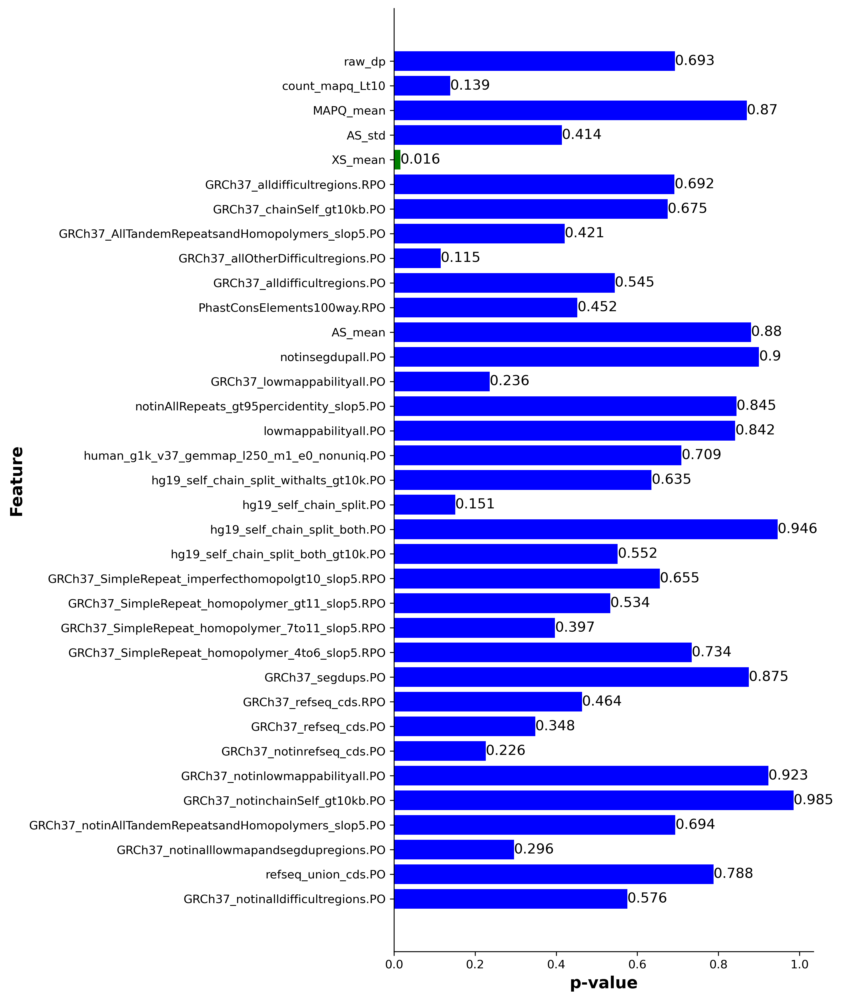

In [16]:
from scipy.stats import ttest_ind
synthetic_data_df = pd.read_csv("synthethic_data_generation.HPO.csv")
#print(synthetic_data_df)

#synthetic_data_df.to_csv("synthetic_data.tsv", index=None, sep='\t')
synthetic_data_nolabels_df = synthetic_data_df.iloc[:, :-1] 
synthetic_data_labels = synthetic_data_df.labels

cols_name_list = synthetic_data_nolabels_df.columns
data_filtered_melt_df = data_filtered_df.melt()
data_filtered_melt_df['type'] = 'Real'
synthetic_data_nolabels_melt_df = synthetic_data_nolabels_df.melt()
synthetic_data_nolabels_melt_df['type'] ='synthethic'

combined_melt_df = pd.concat([data_filtered_melt_df, synthetic_data_nolabels_melt_df])
features_cols = data_filtered_df.columns.tolist()
#for feature in features_cols:
#    x = synthetic_data_nolabels_df[feature]
#    y = data_filtered_df[feature]
    
results_df = pd.DataFrame(columns=['Feature', 't-statistic', 'p-value', 'Significant'])

# Perform the t-test for each feature
for feature in features_cols:
    x = synthetic_data_nolabels_df[feature]
    y = data_filtered_df[feature]
    
    # Perform the two-sided t-test
    t_stat, p_value = ttest_ind(x, y, equal_var=False)  # Use `equal_var=False` for Welch's t-test
    
    # Check significance (p-value < 0.05 for a 95% confidence level)
    significant = p_value < 0.05
    
    # Store the results in the DataFrame
    results_df = results_df.append({'Feature': feature, 't-statistic': t_stat, 'p-value': p_value, 'Significant': significant}, ignore_index=True)

# Display the results


# Plot
plt.figure(figsize=(10, 12))
bars = plt.barh(results_df['Feature'], results_df['p-value'], color=['green' if sig else 'blue' for sig in results_df['Significant']])
plt.xlabel('p-value', fontsize=14,  fontweight='bold')
plt.ylabel('Feature', fontsize=14,  fontweight='bold')
#plt.title('Feature p-values', fontsize=16)

# Add value labels to the bars
for bar in bars:
    xval = bar.get_width()
    plt.text(xval, bar.get_y() + bar.get_height()/2, round(xval, 3), va='center', ha='left', fontsize=12)
sns.despine()
plt.tight_layout()
plt.savefig('synthethic_data_ttest_results.png', dpi=300)
plt.show()

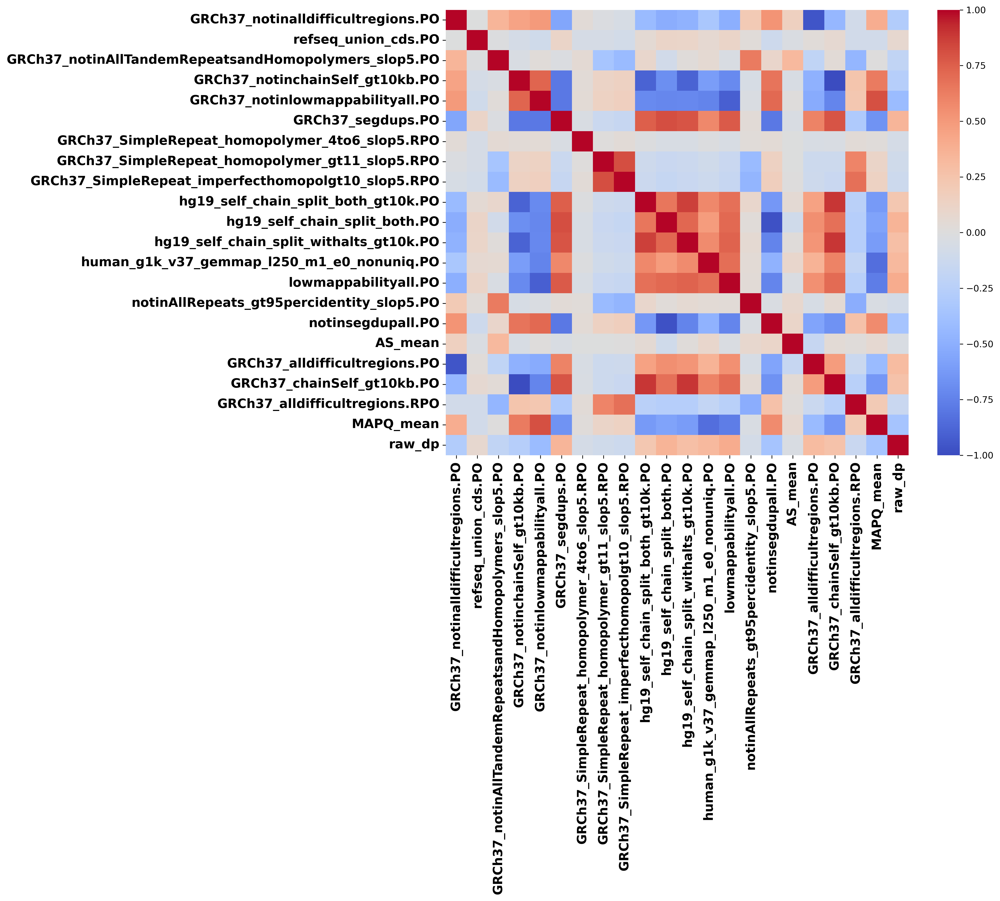

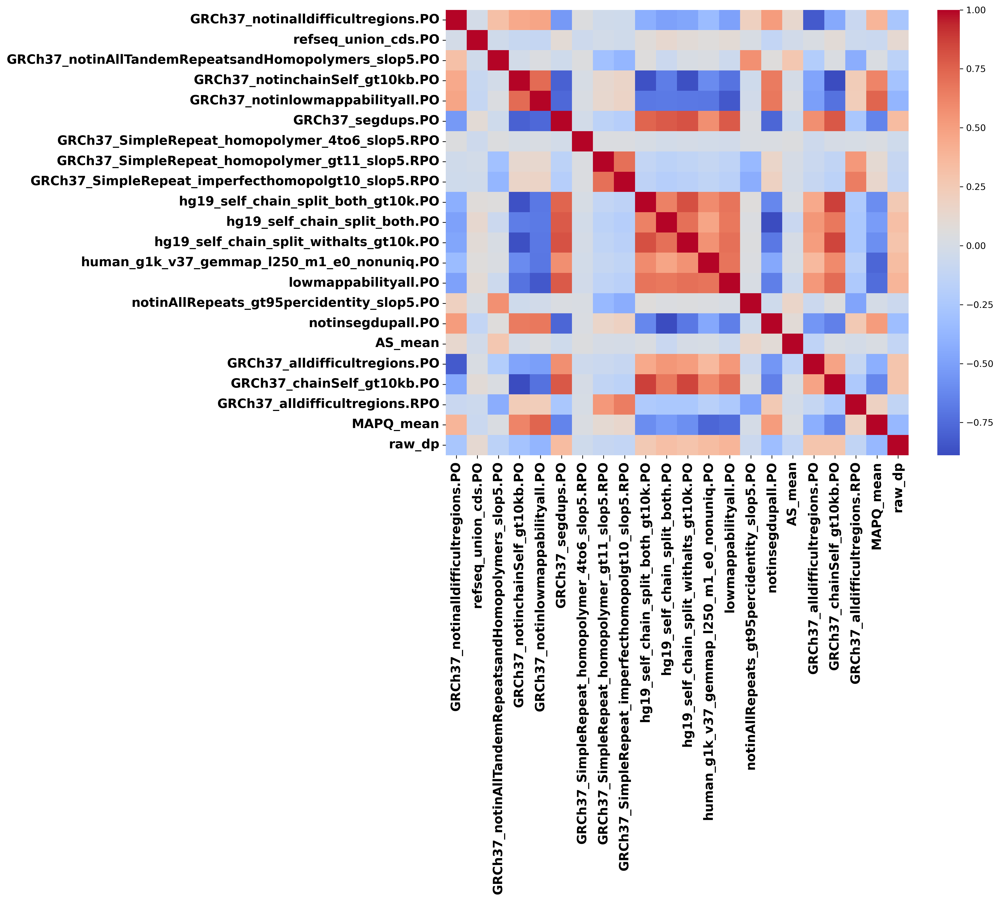

In [17]:
# Calculate the correlation matrices for real and synthetic datasets
import pandas as pd
drop_cols = ['XS_mean', 'count_mapq_Lt10', 'AS_std', 
             'GRCh37_AllTandemRepeatsandHomopolymers_slop5.PO', 'GRCh37_allOtherDifficultregions.PO',
             'PhastConsElements100way.RPO', 'GRCh37_lowmappabilityall.PO',
             'hg19_self_chain_split.PO','GRCh37_refseq_cds.RPO', 'GRCh37_refseq_cds.PO', 'GRCh37_notinrefseq_cds.PO', 
             'GRCh37_notinalllowmapandsegdupregions.PO', 'GRCh37_SimpleRepeat_homopolymer_7to11_slop5.RPO' ]

data_filtered_removed_df =  data_filtered_df.copy()
data_filtered_removed_df = data_filtered_removed_df.drop(drop_cols, axis=1)
synthetic_data_nolabels_remove_df= synthetic_data_nolabels_df.copy()
synthetic_data_nolabels_remove_df = synthetic_data_nolabels_remove_df.drop(drop_cols, axis=1)
real_corr = data_filtered_removed_df.corr()
synthetic_corr = synthetic_data_nolabels_remove_df.corr()

# Compare the correlations
corr_comparison = real_corr.compare(synthetic_corr)

#fig, axes = plt.subplots(1, 2, figsize=(14, 6))
# Plot the real data correlation matrix
plt.figure(figsize=(16, 14))
sns.heatmap(real_corr, cmap='coolwarm', annot=False)
#plt.title('Real Data Correlation Matrix', fontsize=14, fontweight='bold')
plt.xticks(fontsize=14, rotation=90, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('real_data_correlation_matrix.png', dpi=300)
plt.show()

# Plot the synthetic data correlation matrix
plt.figure(figsize=(16, 14))
sns.heatmap(synthetic_corr, cmap='coolwarm', annot=False)
#plt.title('Synthetic Data Correlation Matrix', fontsize=14, fontweight='bold')
plt.xticks(fontsize=14, rotation=90, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig('synthetic_data_correlation_matrix.png', dpi=300)
plt.show()
#data_filtered_df

In [18]:
# Compare the correlations using Frobenius norm
frobenius_norm = np.linalg.norm(real_corr - synthetic_corr)
print(f'Frobenius norm of the correlation matrix difference: {frobenius_norm}')

def compute_rv_coefficient(A, B):
    """
    Compute the RV coefficient between two matrices A and B.

    Parameters:
    A (np.ndarray): First matrix (e.g., correlation matrix).
    B (np.ndarray): Second matrix (e.g., correlation matrix).

    Returns:
    float: RV coefficient.
    """
    def scalar_product(X, Y):
        return np.sum(X * Y)

    AA = scalar_product(A, A)
    BB = scalar_product(B, B)
    AB = scalar_product(A, B)

    rv_coefficient = AB / np.sqrt(AA * BB)
    return rv_coefficient

rv_value = compute_rv_coefficient(real_corr.values, synthetic_corr.values)
print("RV Coefficient:", rv_value)

final_features = data_filtered_removed_df.columns
final_features

Frobenius norm of the correlation matrix difference: 0.6389129990093622
RV Coefficient: 0.9985245723553399


Index(['GRCh37_notinalldifficultregions.PO', 'refseq_union_cds.PO',
       'GRCh37_notinAllTandemRepeatsandHomopolymers_slop5.PO',
       'GRCh37_notinchainSelf_gt10kb.PO', 'GRCh37_notinlowmappabilityall.PO',
       'GRCh37_segdups.PO', 'GRCh37_SimpleRepeat_homopolymer_4to6_slop5.RPO',
       'GRCh37_SimpleRepeat_homopolymer_gt11_slop5.RPO',
       'GRCh37_SimpleRepeat_imperfecthomopolgt10_slop5.RPO',
       'hg19_self_chain_split_both_gt10k.PO', 'hg19_self_chain_split_both.PO',
       'hg19_self_chain_split_withalts_gt10k.PO',
       'human_g1k_v37_gemmap_l250_m1_e0_nonuniq.PO', 'lowmappabilityall.PO',
       'notinAllRepeats_gt95percidentity_slop5.PO', 'notinsegdupall.PO',
       'AS_mean', 'GRCh37_alldifficultregions.PO',
       'GRCh37_chainSelf_gt10kb.PO', 'GRCh37_alldifficultregions.RPO',
       'MAPQ_mean', 'raw_dp'],
      dtype='object')

/projects/wangc/rohan/miniconda3/envs/thesis/lib/python3.9/site-packages/pandas/core/internals/blocks.py:402: RuntimeWarning: invalid value encountered in log
  result = func(self.values, **kwargs)


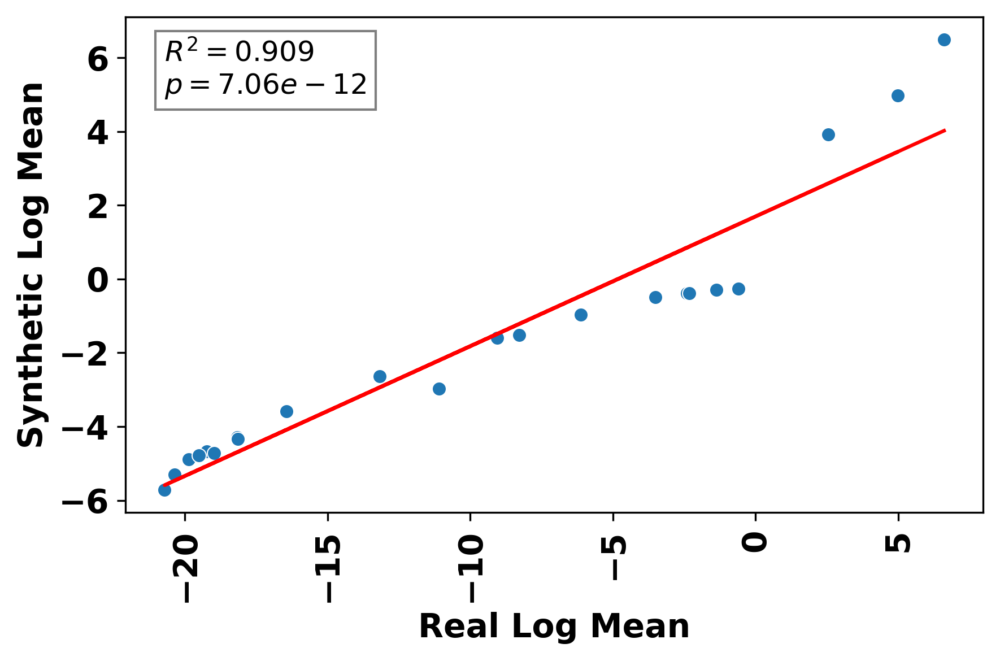

R² (Mean): 0.909
p-value (Mean): 7.06e-12


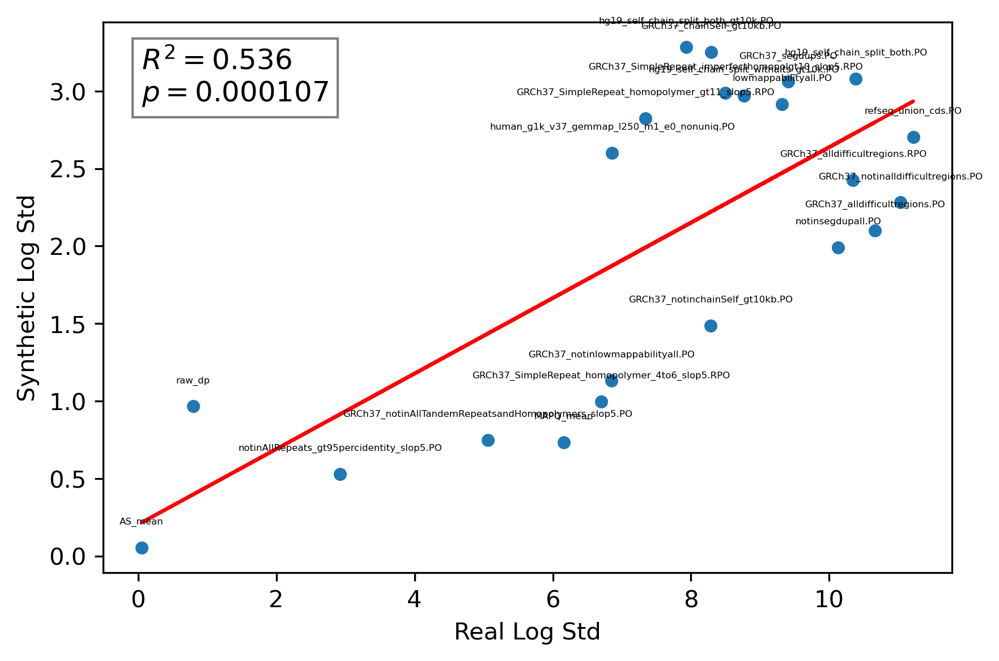

R² (Std): 0.536
p-value (Std): 0.000107


In [21]:
epsilon = 1e-10

synthetic_log_mean_df = pd.DataFrame(np.log(synthetic_data_nolabels_remove_df + epsilon).mean())
real_log_mean_df = pd.DataFrame(np.log(data_filtered_removed_df + epsilon).mean())

synthetic_log_std_df = pd.DataFrame(np.log(synthetic_data_nolabels_remove_df + epsilon).std())
real_log_std_df = pd.DataFrame(np.log(data_filtered_removed_df + epsilon).std())
# Rename columns for clarity
synthetic_log_mean_df.columns = ['Synthetic_Mean']
real_log_mean_df.columns = ['Real_Mean']
synthetic_log_std_df.columns = ['Synthetic_Std']
real_log_std_df.columns = ['Real_Std']

# Combine the dataframes for plotting mean
combined_mean_df = pd.concat([synthetic_log_mean_df, real_log_mean_df], axis=1)
slope_mean, intercept_mean, r_value_mean, p_value_mean, std_err_mean = stats.linregress(combined_mean_df['Real_Mean'], combined_mean_df['Synthetic_Mean'])
line_mean = slope_mean * combined_mean_df['Real_Mean'] + intercept_mean

# Plot mean
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Real_Mean', y='Synthetic_Mean', data=combined_mean_df)
plt.plot(combined_mean_df['Real_Mean'], line_mean, color='red', label=f'Fit line: $y={slope_mean:.2f}x + {intercept_mean:.2f}$')
plt.xticks(fontsize=14, rotation=90, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')
plt.xlabel('Real Log Mean',fontsize=14,  fontweight='bold')
plt.ylabel('Synthetic Log Mean',fontsize=14,  fontweight='bold')
plt.text(min(combined_mean_df['Real_Mean']), max(combined_mean_df['Synthetic_Mean']),
         f'$R^2 = {r_value_mean**2:.3f}$\n$p = {p_value_mean:.3g}$',
         horizontalalignment='left',
         verticalalignment='top',
         fontsize=12,
         bbox=dict(facecolor='white', alpha=0.5))
plt.tight_layout()
plt.savefig('log_mean_plot_syn_vs_real.png', dpi=300)
plt.show()

print(f'R² (Mean): {r_value_mean**2:.3f}')
print(f'p-value (Mean): {p_value_mean:.3g}')

# Combine the dataframes for plotting std
combined_std_df = pd.concat([synthetic_log_std_df, real_log_std_df], axis=1)
slope_std, intercept_std, r_value_std, p_value_std, std_err_std = stats.linregress(combined_std_df['Real_Std'], combined_std_df['Synthetic_Std'])
line_std = slope_std * combined_std_df['Real_Std'] + intercept_std

# Plot std
plt.figure(figsize=(6, 4))
sns.scatterplot(x='Real_Std', y='Synthetic_Std', data=combined_std_df)

for i, feature_name in enumerate(combined_std_df.index):
    plt.annotate(feature_name, (combined_std_df['Real_Std'].iloc[i], combined_std_df['Synthetic_Std'].iloc[i]), textcoords="offset points", xytext=(0,10), ha='center', fontsize=4)


plt.plot(combined_std_df['Real_Std'], line_std, color='red', label=f'Fit line: $y={slope_std:.2f}x + {intercept_std:.2f}$')
plt.xlabel('Real Log Std')
plt.ylabel('Synthetic Log Std')
plt.text(min(combined_std_df['Real_Std']), max(combined_std_df['Synthetic_Std']),
         f'$R^2 = {r_value_std**2:.3f}$\n$p = {p_value_std:.3g}$',
         horizontalalignment='left',
         verticalalignment='top',
         fontsize=12,
         bbox=dict(facecolor='white', alpha=0.5))
plt.tight_layout()
plt.savefig('log_std_plot_syn_vs_real.png', dpi=300)
plt.show()

print(f'R² (Std): {r_value_std**2:.3f}')
print(f'p-value (Std): {p_value_std:.3g}')

In [44]:
from sklearn.manifold import TSNE
data_combine_df = pd.concat([data_filtered_removed_df, synthetic_data_nolabels_remove_df], axis=0)
combined_labels = ['Real'] * len(data_filtered_removed_df) + ['Synthetic'] * len(synthetic_data_nolabels_remove_df)
data_combine_df = data_combine_df.dropna(axis=1, how='any')
data_combine_df


,GRCh37_notinalldifficultregions.PO,refseq_union_cds.PO,GRCh37_notinAllTandemRepeatsandHomopolymers_slop5.PO,GRCh37_notinchainSelf_gt10kb.PO,GRCh37_notinlowmappabilityall.PO,GRCh37_segdups.PO,GRCh37_SimpleRepeat_homopolymer_4to6_slop5.RPO,GRCh37_SimpleRepeat_homopolymer_gt11_slop5.RPO,GRCh37_SimpleRepeat_imperfecthomopolgt10_slop5.RPO,hg19_self_chain_split_both_gt10k.PO,...,human_g1k_v37_gemmap_l250_m1_e0_nonuniq.PO,lowmappabilityall.PO,notinAllRepeats_gt95percidentity_slop5.PO,notinsegdupall.PO,AS_mean,GRCh37_alldifficultregions.PO,GRCh37_chainSelf_gt10kb.PO,GRCh37_alldifficultregions.RPO,MAPQ_mean,raw_dp
0,1.000000,0.000000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,141.833333,0.000000,0.000000,0.000000,60.000000,750.666667
1,0.742000,0.425000,0.742000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,146.000000,0.258000,0.000000,0.554000,60.000000,157.000000
2,0.000000,0.900000,1.000000,1.000000,1.000000,0.000000,1.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.417000,1.000000,146.000000,1.000000,0.000000,0.395000,60.000000,636.000000
3,1.000000,0.792000,1.000000,1.000000,1.000000,0.000000,0.905000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,151.000000,0.000000,0.000000,0.000000,60.000000,977.000000
4,1.000000,0.850000,1.000000,1.000000,1.000000,0.000000,0.911000,0.000000,0.000000,0.000000,...,0.000000,0.000000,1.000000,1.000000,148.666667,0.000000,0.000000,0.000000,60.000000,568.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11355,0.011124,0.003257,0.296473,0.999322,1.006027,0.000706,0.955920,0.004835,-0.004075,-0.002416,...,-0.001475,1.014898,0.391828,0.999924,145.882609,1.007530,-0.002473,0.122842,60.042845,1364.899679
11356,-0.011018,0.010243,0.415587,-0.009462,-0.005571,1.018660,1.003712,-0.001717,0.007249,0.980828,...,1.030471,1.028028,0.396402,-0.000900,147.993008,1.007569,0.995457,0.006001,-3.673716,2713.430670
11357,0.353801,0.980059,0.373554,1.003074,0.999365,0.000496,0.837136,-0.000118,1.019750,-0.003352,...,0.003499,0.000470,0.393975,1.005744,145.132542,0.484238,0.003397,0.990914,59.935035,1274.726196
11358,1.013450,0.821257,0.387244,0.998073,1.002271,0.001958,0.036369,-0.002006,-0.001757,0.000213,...,0.000696,0.002575,0.840101,0.997573,146.024818,0.120212,-0.001508,-0.003331,59.939388,453.917023


In [45]:
tsne = TSNE(n_components=2, random_state=42)
tsne_results = tsne.fit_transform(data_combine_df)

# Create a DataFrame for t-SNE results
tsne_df = pd.DataFrame(tsne_results, columns=['TSNE1', 'TSNE2'])
tsne_df['Data'] = combined_labels


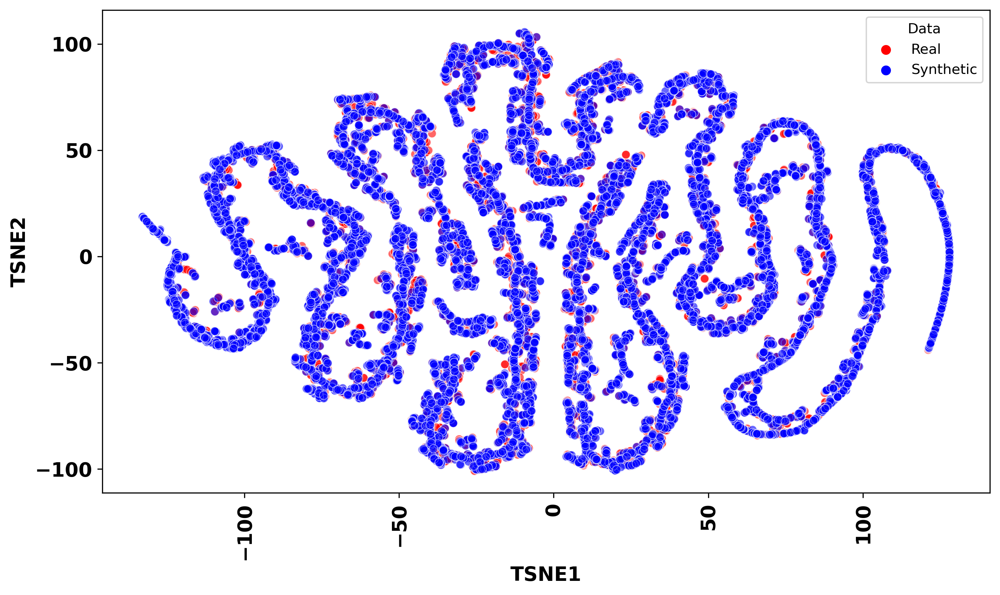

In [49]:
plt.figure(figsize=(10, 6))
sns.scatterplot(
    x='TSNE1', y='TSNE2',
    hue='Data',
    data=tsne_df,
    alpha=0.6,
    palette=['red', 'blue'] 
)
#plt.title('t-SNE of Real and Synthetic Data')
plt.xticks(fontsize=14, rotation=90, fontweight='bold')
plt.yticks(fontsize=14, fontweight='bold')
plt.xlabel('TSNE1', fontsize=14,  fontweight='bold')
plt.ylabel('TSNE2', fontsize=14,  fontweight='bold')
plt.tight_layout()
plt.savefig('TSNE_synthetic_real.HPO.png', dpi=300)
plt.show()

In [63]:
tsne_df
real_data = tsne_df[tsne_df['Data'] == 'Real'][['TSNE1', 'TSNE2']].values
synthetic_data = tsne_df[tsne_df['Data'] == 'Synthetic'][['TSNE1', 'TSNE2']].values

# Compute pairwise distances between synthetic and real data
distances_synthetic_to_real = cdist(synthetic_data, real_data, 'euclidean')
distances_real_to_synthetic = cdist(real_data, synthetic_data, 'euclidean')
#synthetic_data
# Calculate statistics
mean_distance_synthetic_to_real = np.mean(np.min(distances_synthetic_to_real, axis=1))
mean_distance_real_to_synthetic = np.mean(np.min(distances_real_to_synthetic, axis=1))

median_distance_synthetic_to_real = np.median(np.min(distances_synthetic_to_real, axis=1))
median_distance_real_to_synthetic = np.median(np.min(distances_real_to_synthetic, axis=1))

print(f"Mean distance from synthetic to real: {mean_distance_synthetic_to_real}")
print(f"Mean distance from real to synthetic: {mean_distance_real_to_synthetic}")
print(f"Median distance from synthetic to real: {median_distance_synthetic_to_real}")
print(f"Median distance from real to synthetic: {median_distance_real_to_synthetic}")

Mean distance from synthetic to real: 0.5096867344757479
Mean distance from real to synthetic: 0.3592822519979891
Median distance from synthetic to real: 0.2624548942618544
Median distance from real to synthetic: 0.2629852832341961


In [33]:
#Transform the data for learning

def preprocess_data(df, labels, test_size=0.3, val_size=0.1, random_state=42):
    # Initialize MinMaxScaler
    min_max_scaler = preprocessing.MinMaxScaler()
    
    # Scale the dataframe
    scaled_df = pd.DataFrame(min_max_scaler.fit_transform(df.values), columns=df.columns, index=df.index)
    
    # Get the values and indices
    X = scaled_df.values
    y = labels.values
    indices = scaled_df.index
    
    # Split the data into training and testing sets
    X_train, X_test, y_train, y_test, train_indices, test_indices = train_test_split(
        X, y, indices, test_size=test_size, random_state=random_state
    )
    
    return X, y, X_train, X_test, y_train, y_test, min_max_scaler, train_indices, test_indices

data_filtered_df
X, y, X_train,  X_test, y_train, y_test, scaler, train_indices, test_indices = preprocess_data(data_filtered_removed_df, labels)
print("Number of samples in training set:", len(X_train))
print("Number of samples in testing set:", len(X_test))

X_syn, y_syn, X_syn_train,  X_syn_test, y_syn_train, y_syn_test, scaler, train_syn_indices, test_syn_indices = preprocess_data(synthetic_data_nolabels_remove_df, synthetic_data_labels)
print("Number of samples in training set:", len(X_syn_train))
print("Number of samples in testing set:", len(X_syn_test))

X_combined_train = np.concatenate((X_train, X_syn_train), axis=0)
y_combined_train = np.concatenate((y_train, y_syn_train), axis=0)

# Combine the original and synthetic testing sets
X_combined_test = np.concatenate((X_test, X_syn_test), axis=0)
y_combined_test = np.concatenate((y_test, y_syn_test), axis=0)

print("Number of samples in combined training set:", len(X_combined_train))
print("Number of samples in combined testing set:", len(X_combined_test))

Number of samples in training set: 7952
Number of samples in testing set: 3408
Number of samples in training set: 7952
Number of samples in testing set: 3408
Number of samples in combined training set: 15904
Number of samples in combined testing set: 6816


In [65]:
class TabbPN(nn.Module):
    def __init__(self, input_size, hidden_size, output_size):
        super(TabbPN, self).__init__()
        self.fc1 = nn.Linear(input_size, hidden_size)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_size, output_size)
        self.sigmoid = nn.Sigmoid()

    def forward(self, x):
        out = self.fc1(x)
        out = self.relu(out)
        out = self.fc2(out)
        out = self.sigmoid(out)
        return out

    
def calculate_auc_with_ci(y_true, y_pred_proba, n_bootstrap=1000):
    aucs = []
    pr_aucs = []
    
    for _ in range(n_bootstrap):
        idx = np.random.choice(len(y_true), size=len(y_true), replace=True)
        sample_true = np.array(y_true)[idx]
        sample_pred_proba = np.array(y_pred_proba)[idx]
        
        auc = roc_auc_score(sample_true, sample_pred_proba)
        aucs.append(auc)
        
        pr_auc = average_precision_score(sample_true, sample_pred_proba)
        pr_aucs.append(pr_auc)

    auc_mean = np.mean(aucs)
    auc_ci = np.percentile(aucs, [2.5, 97.5])  # Use percentile for CI calculation
    
    pr_auc_mean = np.mean(pr_aucs)
    pr_auc_ci = np.percentile(pr_aucs, [2.5, 97.5])  # Use percentile for CI calculation

    return auc_mean, auc_ci, pr_auc_mean, pr_auc_ci


# Preprocess data using TabbPN
def preprocess_tabular_data(data, labels):
    # Assuming TabbPN preprocessing steps here
    X_processed = data  # Replace this with TabbPN preprocessing
    y = labels.values
    X_train, X_test, y_train, y_test = train_test_split(X_processed, y, test_size=0.2, random_state=42)
    return X_train, X_test, y_train, y_test

# Train TabbPN model
def train_tabular_model(X_train, y_train, input_size, hidden_size, output_size, num_epochs=100, lr=0.001):
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')

    model = TabbPN(input_size, hidden_size, output_size).to(device)
    criterion = nn.BCELoss()
    optimizer = optim.Adam(model.parameters(), lr=lr)

    train_dataset = TensorDataset(torch.FloatTensor(X_train), torch.FloatTensor(y_train))
    train_loader = DataLoader(train_dataset, batch_size=64, shuffle=True)

    for epoch in range(num_epochs):
        model.train()
        for inputs, targets in train_loader:
            inputs, targets = inputs.to(device), targets.to(device)

            optimizer.zero_grad()
            outputs = model(inputs)
            loss = criterion(outputs, targets.unsqueeze(1))
            loss.backward()
            optimizer.step()

    return model

def train_and_evaluate_tabular_model(X_train, y_train, X_test, y_test, hidden_size=8, output_size=1, n_bootstrap=1000):
    input_size = X_train.shape[1]
    tabbpn_model = train_tabular_model(X_train, y_train, input_size, hidden_size, output_size)
    device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
    X_test_tensor = torch.FloatTensor(X_test).to(device)
    tabbpn_model.eval()
    with torch.no_grad():
        y_pred_proba = tabbpn_model(X_test_tensor).cpu().numpy().flatten()

    rnn_auc, rnn_auc_ci, rnn_pr_auc, rnn_pr_auc_ci = calculate_auc_with_ci(y_test, y_pred_proba, n_bootstrap)
    print("TabbPN AUC:", rnn_auc, "with CI:", rnn_auc_ci)
    
    return rnn_auc, rnn_auc_ci, rnn_pr_auc, rnn_pr_auc_ci


/projects/wangc/rohan/miniconda3/envs/thesis/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


TabbPN AUC: 0.8577076962465034 with CI: [0.84535414 0.87038692]
Random Forest AUC: 0.8800265858646837 with CI: [0.86789081 0.8915249 ]
XGBoost AUC: 0.8732754702412262 with CI: [0.86073954 0.88486091]
SVM AUC: 0.8603411864706156 with CI: [0.84770083 0.87316298]
MLP AUC: 0.8721444623815262 with CI: [0.86054039 0.88407925]
Naive Bayes AUC: 0.8501559312334368 with CI: [0.83659729 0.86292777]
Neural Network AUC: 0.8577076962465034 with CI: [0.84535414 0.87038692]


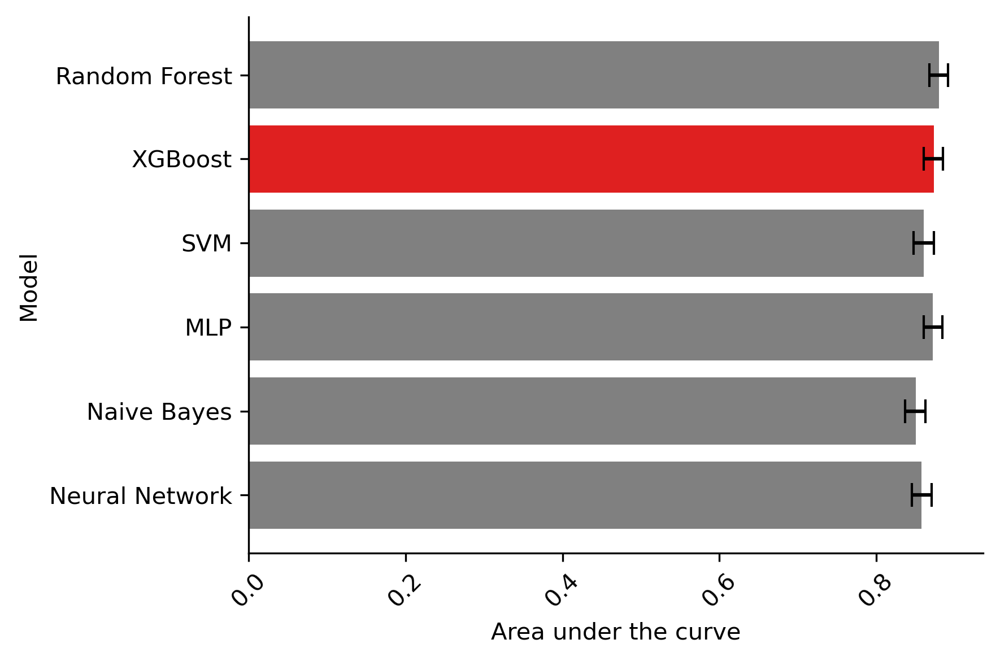

In [66]:
# Random Forest
rf_model = RandomForestClassifier()
rf_model.fit(X_syn_train, y_syn_train)
rf_pred_proba = rf_model.predict_proba(X_syn_test)[:, 1]
rf_auc, rf_auc_ci, rf_pr_auc, rf_pr_auc_ci = calculate_auc_with_ci(y_syn_test, rf_pred_proba)

# XGBoost
xgb_model = XGBClassifier()
xgb_model.fit(X_syn_train, y_syn_train)
xgb_pred_proba = xgb_model.predict_proba(X_syn_test)[:, 1]
xgb_auc, xgb_auc_ci, xgb_pr_auc, xgb_pr_auc_ci = calculate_auc_with_ci(y_syn_test, xgb_pred_proba)

# SVM
svm_model = SVC(probability=True)
svm_model.fit(X_syn_train, y_syn_train)
svm_pred_proba = svm_model.predict_proba(X_syn_test)[:, 1]
svm_auc, svm_auc_ci, svm_pr_auc, svm_pr_auc_ci = calculate_auc_with_ci(y_syn_test, svm_pred_proba)

# MLP
mlp_model = MLPClassifier()
mlp_model.fit(X_syn_train, y_syn_train)
mlp_pred_proba = mlp_model.predict_proba(X_syn_test)[:, 1]
mlp_auc, mlp_auc_ci, mlp_pr_auc, mlp_pr_auc_ci = calculate_auc_with_ci(y_syn_test, mlp_pred_proba)

# Naive Bayes
nb_model = GaussianNB()
nb_model.fit(X_syn_train, y_syn_train)
nb_pred_proba = nb_model.predict_proba(X_syn_test)[:, 1]
nb_auc, nb_auc_ci, nb_pr_auc, nb_pr_auc_ci = calculate_auc_with_ci(y_syn_test, nb_pred_proba)


rnn_auc, rnn_auc_ci, rnn_pr_auc, rnn_pr_auc_ci = train_and_evaluate_tabular_model(X_syn_train, y_syn_train, X_syn_test, y_syn_test)

# Print AUC and AUC CI for each model
print("Random Forest AUC:", rf_auc, "with CI:", rf_auc_ci)
print("XGBoost AUC:", xgb_auc, "with CI:", xgb_auc_ci)
print("SVM AUC:", svm_auc, "with CI:", svm_auc_ci)
print("MLP AUC:", mlp_auc, "with CI:", mlp_auc_ci)
print("Naive Bayes AUC:", nb_auc, "with CI:", nb_auc_ci)
print("Neural Network AUC:", rnn_auc, "with CI:", rnn_auc_ci)

# Create a DataFrame
models = ['Random Forest', 'XGBoost', 'SVM', 'MLP', 'Naive Bayes', 'Neural Network']
auc_values = [rf_auc, xgb_auc, svm_auc, mlp_auc, nb_auc, rnn_auc]
auc_ci_low = [auc - ci[0] for auc, ci in zip(auc_values, [rf_auc_ci, xgb_auc_ci, svm_auc_ci, mlp_auc_ci, nb_auc_ci, rnn_auc_ci])]
auc_ci_high = [ci[1] - auc for auc, ci in zip(auc_values, [rf_auc_ci, xgb_auc_ci, svm_auc_ci, mlp_auc_ci, nb_auc_ci, rnn_auc_ci])]

auc_df = pd.DataFrame({
    'Model': models,
    'AUC': auc_values,
    'AUC_CI_low': auc_ci_low,
    'AUC_CI_high': auc_ci_high
})

colors = ["grey"] * len(auc_df)
colors[auc_df[auc_df["Model"] == "XGBoost"].index[0]] = "red"

# Create barplot
plt.figure(figsize=(6, 4))
ax = sns.barplot(data=auc_df, y='Model', x='AUC', ci=None, palette=colors)

# Add AUC values at the tips of the bars
#for i, (auc, model) in enumerate(zip(auc_df['AUC'], auc_df['Model'])):
#    ax.text(auc, i, f'{auc:.3f}', va='center')

# Add confidence intervals with error bars
auc_values = auc_df['AUC'].values
auc_ci_low = auc_df['AUC_CI_low'].values
auc_ci_high = auc_df['AUC_CI_high'].values
#plt.errorbar(y=range(len(auc_df)), x=auc_values, xerr=[auc_values - auc_ci_low, auc_ci_high - auc_values],
#             fmt='none', color='black', capsize=5)
plt.errorbar(y=range(len(models)), x=auc_values,xerr=[auc_ci_low, auc_ci_high], fmt='none', color='black', capsize=5)
# Customize plot
plt.xticks(rotation=45)
plt.xlabel('Area under the curve')
plt.ylabel('Model')
plt.tight_layout()
sns.despine()
plt.savefig('baseline_model_plot.synthetic.png', dpi=400)

/projects/wangc/rohan/miniconda3/envs/thesis/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Random Forest AUC: 0.9084523389515302 with CI: [0.89836545 0.91849292]
XGBoost AUC: 0.9055974269667155 with CI: [0.89481223 0.91550873]
SVM AUC: 0.8726839644463357 with CI: [0.86061456 0.8843042 ]
MLP AUC: 0.8998275715045552 with CI: [0.88840225 0.91048793]
Naive Bayes AUC: 0.8671495784724496 with CI: [0.85494973 0.87861142]
LNN AUC: 0.8577076962465034 with CI: [0.84535414 0.87038692]
TabbPN AUC: 0.8778837937239417 with CI: [0.86560108 0.88932344]
Random Forest AUC: 0.9084523389515302 with CI: [0.89836545 0.91849292]
XGBoost AUC: 0.9055974269667155 with CI: [0.89481223 0.91550873]
SVM AUC: 0.8726839644463357 with CI: [0.86061456 0.8843042 ]
MLP AUC: 0.8998275715045552 with CI: [0.88840225 0.91048793]
Naive Bayes AUC: 0.8671495784724496 with CI: [0.85494973 0.87861142]
Neural Network AUC: 0.8778837937239417 with CI: [0.86560108 0.88932344]


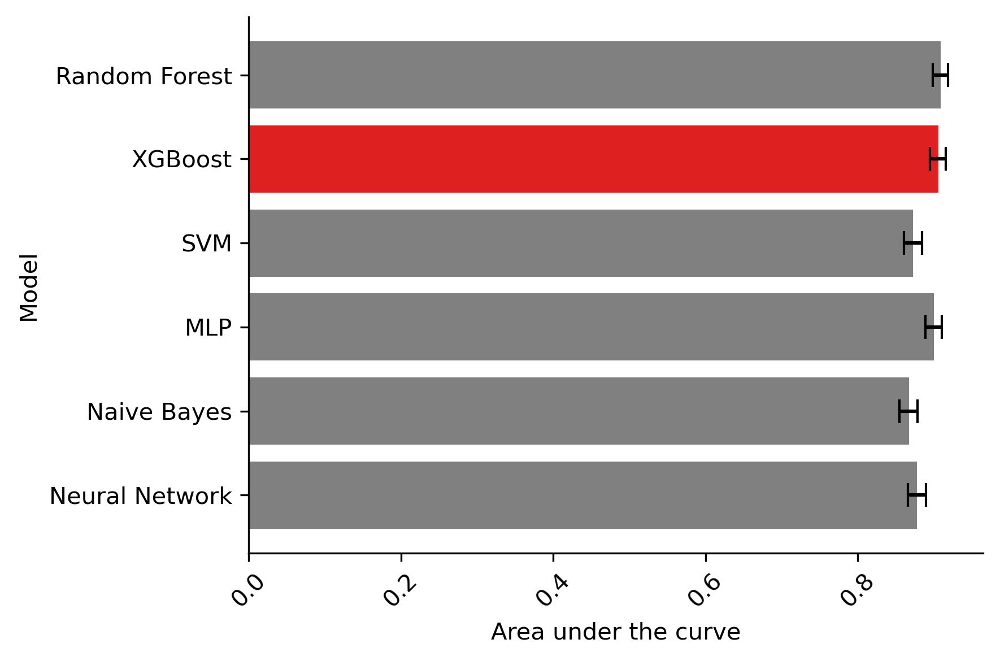

In [67]:
rf_model = RandomForestClassifier()
rf_model.fit(X_train, y_train)
rf_pred_proba = rf_model.predict_proba(X_test)[:, 1]
rf_auc, rf_auc_ci, rf_pr_auc, rf_pr_auc_ci = calculate_auc_with_ci(y_test, rf_pred_proba)

# XGBoost
xgb_model = XGBClassifier()
xgb_model.fit(X_train, y_train)
xgb_pred_proba = xgb_model.predict_proba(X_test)[:, 1]
xgb_auc, xgb_auc_ci, xgb_pr_auc, xgb_pr_auc_ci = calculate_auc_with_ci(y_test, xgb_pred_proba)

# SVM
svm_model = SVC(probability=True)
svm_model.fit(X_train, y_train)
svm_pred_proba = svm_model.predict_proba(X_test)[:, 1]
svm_auc, svm_auc_ci, svm_pr_auc, svm_pr_auc_ci = calculate_auc_with_ci(y_test, svm_pred_proba)

# MLP
mlp_model = MLPClassifier()
mlp_model.fit(X_train, y_train)
mlp_pred_proba = mlp_model.predict_proba(X_test)[:, 1]
mlp_auc, mlp_auc_ci, mlp_pr_auc, mlp_pr_auc_ci = calculate_auc_with_ci(y_test, mlp_pred_proba)

# Naive Bayes
nb_model = GaussianNB()
nb_model.fit(X_train, y_train)
nb_pred_proba = nb_model.predict_proba(X_test)[:, 1]
nb_auc, nb_auc_ci, nb_pr_auc, nb_pr_auc_ci = calculate_auc_with_ci(y_test, nb_pred_proba)



# Print AUC and AUC CI for each model
print("Random Forest AUC:", rf_auc, "with CI:", rf_auc_ci)
print("XGBoost AUC:", xgb_auc, "with CI:", xgb_auc_ci)
print("SVM AUC:", svm_auc, "with CI:", svm_auc_ci)
print("MLP AUC:", mlp_auc, "with CI:", mlp_auc_ci)
print("Naive Bayes AUC:", nb_auc, "with CI:", nb_auc_ci)
print("LNN AUC:", rnn_auc, "with CI:", rnn_auc_ci)

rnn_auc, rnn_auc_ci, rnn_pr_auc, rnn_pr_auc_ci = train_and_evaluate_tabular_model(X_train, y_train, X_test, y_test)

# Print AUC and AUC CI for each model
print("Random Forest AUC:", rf_auc, "with CI:", rf_auc_ci)
print("XGBoost AUC:", xgb_auc, "with CI:", xgb_auc_ci)
print("SVM AUC:", svm_auc, "with CI:", svm_auc_ci)
print("MLP AUC:", mlp_auc, "with CI:", mlp_auc_ci)
print("Naive Bayes AUC:", nb_auc, "with CI:", nb_auc_ci)
print("Neural Network AUC:", rnn_auc, "with CI:", rnn_auc_ci)

# Create a DataFrame
models = ['Random Forest', 'XGBoost', 'SVM', 'MLP', 'Naive Bayes', 'Neural Network']
auc_values = [rf_auc, xgb_auc, svm_auc, mlp_auc, nb_auc, rnn_auc]
auc_ci_low = [auc - ci[0] for auc, ci in zip(auc_values, [rf_auc_ci, xgb_auc_ci, svm_auc_ci, mlp_auc_ci, nb_auc_ci, rnn_auc_ci])]
auc_ci_high = [ci[1] - auc for auc, ci in zip(auc_values, [rf_auc_ci, xgb_auc_ci, svm_auc_ci, mlp_auc_ci, nb_auc_ci, rnn_auc_ci])]

auc_df = pd.DataFrame({
    'Model': models,
    'AUC': auc_values,
    'AUC_CI_low': auc_ci_low,
    'AUC_CI_high': auc_ci_high
})


colors = ["grey"] * len(auc_df)
colors[auc_df[auc_df["Model"] == "XGBoost"].index[0]] = "red"

# Create barplot
plt.figure(figsize=(6, 4))
ax = sns.barplot(data=auc_df, y='Model', x='AUC', ci=None, palette=colors)

# Add AUC values at the tips of the bars
#for i, (auc, model) in enumerate(zip(auc_df['AUC'], auc_df['Model'])):
#    ax.text(auc, i, f'{auc:.3f}', va='center')

# Add confidence intervals with error bars
auc_values = auc_df['AUC'].values
auc_ci_low = auc_df['AUC_CI_low'].values
auc_ci_high = auc_df['AUC_CI_high'].values
#plt.errorbar(y=range(len(auc_df)), x=auc_values, xerr=[auc_values - auc_ci_low, auc_ci_high - auc_values],
#             fmt='none', color='black', capsize=5)
plt.errorbar(y=range(len(models)), x=auc_values,xerr=[auc_ci_low, auc_ci_high], fmt='none', color='black', capsize=5)
# Customize plot
plt.xticks(rotation=45)
plt.xlabel('Area under the curve')
plt.ylabel('Model')
plt.tight_layout()
sns.despine()
plt.savefig('baseline_model_plot.real.png', dpi=400)



/projects/wangc/rohan/miniconda3/envs/thesis/lib/python3.9/site-packages/sklearn/neural_network/_multilayer_perceptron.py:690: ConvergenceWarning: Stochastic Optimizer: Maximum iterations (200) reached and the optimization hasn't converged yet.
  warnings.warn(


Random Forest AUC: 0.8949351917716883 with CI: [0.88708225 0.90276841]
XGBoost AUC: 0.8895329175989317 with CI: [0.88148979 0.89725218]
SVM AUC: 0.8516858299922223 with CI: [0.84222946 0.86138825]
MLP AUC: 0.8797616253544728 with CI: [0.87084554 0.88784192]
Naive Bayes AUC: 0.8515675510271538 with CI: [0.84301874 0.86099861]
LNN AUC: 0.8778837937239417 with CI: [0.86560108 0.88932344]
TabbPN AUC: 0.870198961671057 with CI: [0.86152057 0.87882578]
Random Forest AUC: 0.8949351917716883 with CI: [0.88708225 0.90276841]
XGBoost AUC: 0.8895329175989317 with CI: [0.88148979 0.89725218]
SVM AUC: 0.8516858299922223 with CI: [0.84222946 0.86138825]
MLP AUC: 0.8797616253544728 with CI: [0.87084554 0.88784192]
Naive Bayes AUC: 0.8515675510271538 with CI: [0.84301874 0.86099861]
Neural Network AUC: 0.870198961671057 with CI: [0.86152057 0.87882578]


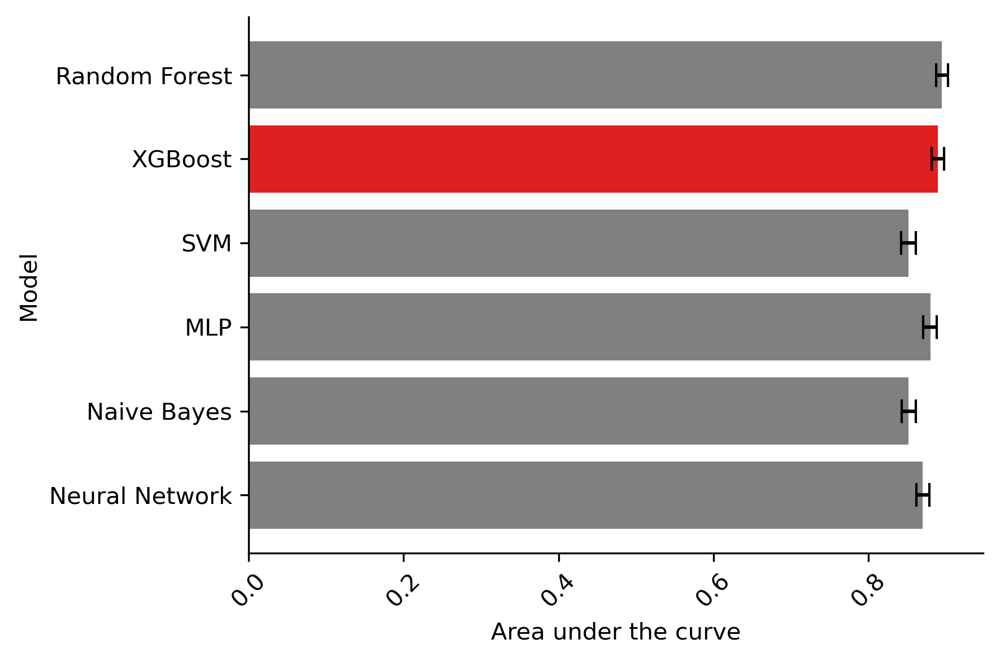

In [68]:
rf_model = RandomForestClassifier()
rf_model.fit(X_combined_train, y_combined_train)
rf_pred_proba = rf_model.predict_proba(X_combined_test)[:, 1]
rf_auc, rf_auc_ci, rf_pr_auc, rf_pr_auc_ci = calculate_auc_with_ci(y_combined_test, rf_pred_proba)

# XGBoost
xgb_model = XGBClassifier()
xgb_model.fit(X_combined_train, y_combined_train)
xgb_pred_proba = xgb_model.predict_proba(X_combined_test)[:, 1]
xgb_auc, xgb_auc_ci, xgb_pr_auc, xgb_pr_auc_ci = calculate_auc_with_ci(y_combined_test, xgb_pred_proba)

# SVM
svm_model = SVC(probability=True)
svm_model.fit(X_combined_train, y_combined_train)
svm_pred_proba = svm_model.predict_proba(X_combined_test)[:, 1]
svm_auc, svm_auc_ci, svm_pr_auc, svm_pr_auc_ci = calculate_auc_with_ci(y_combined_test, svm_pred_proba)

# MLP
mlp_model = MLPClassifier()
mlp_model.fit(X_combined_train, y_combined_train)
mlp_pred_proba = mlp_model.predict_proba(X_combined_test)[:, 1]
mlp_auc, mlp_auc_ci, mlp_pr_auc, mlp_pr_auc_ci = calculate_auc_with_ci(y_combined_test, mlp_pred_proba)

# Naive Bayes
nb_model = GaussianNB()
nb_model.fit(X_combined_train, y_combined_train)
nb_pred_proba = nb_model.predict_proba(X_combined_test)[:, 1]
nb_auc, nb_auc_ci, nb_pr_auc, nb_pr_auc_ci = calculate_auc_with_ci(y_combined_test, nb_pred_proba)



# Print AUC and AUC CI for each model
print("Random Forest AUC:", rf_auc, "with CI:", rf_auc_ci)
print("XGBoost AUC:", xgb_auc, "with CI:", xgb_auc_ci)
print("SVM AUC:", svm_auc, "with CI:", svm_auc_ci)
print("MLP AUC:", mlp_auc, "with CI:", mlp_auc_ci)
print("Naive Bayes AUC:", nb_auc, "with CI:", nb_auc_ci)
print("LNN AUC:", rnn_auc, "with CI:", rnn_auc_ci)

rnn_auc, rnn_auc_ci, rnn_pr_auc, rnn_pr_auc_ci = train_and_evaluate_tabular_model(X_combined_train, y_combined_train,
                                                                                  X_combined_test, y_combined_test)

# Print AUC and AUC CI for each model
print("Random Forest AUC:", rf_auc, "with CI:", rf_auc_ci)
print("XGBoost AUC:", xgb_auc, "with CI:", xgb_auc_ci)
print("SVM AUC:", svm_auc, "with CI:", svm_auc_ci)
print("MLP AUC:", mlp_auc, "with CI:", mlp_auc_ci)
print("Naive Bayes AUC:", nb_auc, "with CI:", nb_auc_ci)
print("Neural Network AUC:", rnn_auc, "with CI:", rnn_auc_ci)

# Create a DataFrame
models = ['Random Forest', 'XGBoost', 'SVM', 'MLP', 'Naive Bayes', 'Neural Network']
auc_values = [rf_auc, xgb_auc, svm_auc, mlp_auc, nb_auc, rnn_auc]
auc_ci_low = [auc - ci[0] for auc, ci in zip(auc_values, [rf_auc_ci, xgb_auc_ci, svm_auc_ci, mlp_auc_ci, nb_auc_ci, rnn_auc_ci])]
auc_ci_high = [ci[1] - auc for auc, ci in zip(auc_values, [rf_auc_ci, xgb_auc_ci, svm_auc_ci, mlp_auc_ci, nb_auc_ci, rnn_auc_ci])]

auc_df = pd.DataFrame({
    'Model': models,
    'AUC': auc_values,
    'AUC_CI_low': auc_ci_low,
    'AUC_CI_high': auc_ci_high
})


colors = ["grey"] * len(auc_df)
colors[auc_df[auc_df["Model"] == "XGBoost"].index[0]] = "red"

# Create barplot
plt.figure(figsize=(6, 4))
ax = sns.barplot(data=auc_df, y='Model', x='AUC', ci=None, palette=colors)

# Add AUC values at the tips of the bars
#for i, (auc, model) in enumerate(zip(auc_df['AUC'], auc_df['Model'])):
#    ax.text(auc, i, f'{auc:.3f}', va='center')

# Add confidence intervals with error bars
auc_values = auc_df['AUC'].values
auc_ci_low = auc_df['AUC_CI_low'].values
auc_ci_high = auc_df['AUC_CI_high'].values
#plt.errorbar(y=range(len(auc_df)), x=auc_values, xerr=[auc_values - auc_ci_low, auc_ci_high - auc_values],
#             fmt='none', color='black', capsize=5)
plt.errorbar(y=range(len(models)), x=auc_values,xerr=[auc_ci_low, auc_ci_high], fmt='none', color='black', capsize=5)
# Customize plot
plt.xticks(rotation=45)
plt.xlabel('Area under the curve', fontsize=14,  fontweight='bold')
plt.ylabel('Model',fontsize=14,  fontweight='bold')
plt.tight_layout()
sns.despine()
plt.savefig('baseline_model_plot.combined.png', dpi=400)




In [ ]:
model = XGBClassifier()
model.fit(X_combined_train, y_combined_train)

y_pred_proba = model.predict_proba(X_combined_test)[:, 1]  # Predict probabilities for the positive class
auc = roc_auc_score(y_combined_test, y_pred_proba)

print(f"AUC: {auc:.4f}")

thresholds = np.sort(model.feature_importances_)

#feature_df = pd.DataFrame(columns=['total_features', 'auc'])

feature_dict = {'total_features': [], 'auc': []}

for thresh in thresholds:
    selection = SelectFromModel(model, threshold=thresh, prefit=True)
    select_X_train = selection.transform(X_combined_train)
    selection_model = XGBClassifier()
    selection_model.fit(select_X_train, y_combined_train)
    select_X_test = selection.transform(X_combined_test)
    y_pred_proba = selection_model.predict_proba(select_X_test)[:, 1]
    auc = roc_auc_score(y_combined_test, y_pred_proba)
    feature_dict['total_features'].append(select_X_train.shape[1])
    feature_dict['auc'].append(auc)
    #feature_df = feature_df.append({'total_features': select_X_train.shape[1], 'auc': auc}, ignore_index=True)
    print("Thresh=%.3f, n=%d, AUC: %.4f" % (thresh, select_X_train.shape[1], auc))

# Plotting
feature_df = pd.DataFrame(feature_dict)
plt.figure(figsize=(10, 6))
sns.scatterplot(data=feature_df, x='total_features', y='auc', color='blue')
sns.lineplot(data=feature_df, x='total_features', y='auc', color='red')
plt.xlabel('Total Features')
plt.ylabel('AUC')
plt.title('AUC vs Total Features')
plt.legend(['AUC Curve'])
sns.despine()
plt.savefig('top_features_choice_plot.png', dpi=400)
plt.show()

In [ ]:

top_indices = np.argsort(model.feature_importances_)[::-1][:17]

# Get the names of the top 26 features based on their indices
top_features = data_filtered_df.columns[top_indices]
cmap = plt.cm.get_cmap('Greys', len(top_features))
# Get the importance scores of the top 26 features
top_importance = model.feature_importances_[top_indices]

# Create a bar plot
plt.figure(figsize=(10, 9))
plt.barh(top_features, top_importance)
#bars = plt.barh(top_features, top_importance, color=[cmap(i) for i in range(len(top_features))])
#plt.xlabel('Importance')
#plt.ylabel('Features')
plt.xlabel('Importance', fontsize=16)  # Adjust fontsize as needed
plt.ylabel('Features', fontsize=16)
#plt.title('Top 26 Features by Importance')
plt.gca().invert_yaxis()  # Invert y-axis to show the most important feature on top
# Adjust x and y axis labels size
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)
 # Adjust fontsize as needed
sns.despine()
# Show legend
plt.legend(fontsize=14)

plt.show()

In [81]:
!pip install xgboost --upgrade

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 153.9/153.9 MB 4.6 MB/s eta 0:00:000m eta 0:00:0136m0:00:01m
  Attempting uninstall: xgboost
    Found existing installation: xgboost 1.5.0
    Uninstalling xgboost-1.5.0:
      Successfully uninstalled xgboost-1.5.0


In [83]:
import xgboost as xgb

results_optuna = []
params_optuna = []

def objective(trial):
    # Define the search space for hyperparameters
    params = {
        'max_depth': trial.suggest_int('max_depth', 1, 100),  # Expanded range for max_depth
        'n_estimators': trial.suggest_int('n_estimators', 100, 10000, log=True),  # Log scale for n_estimators
        'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.1, 1.0),
        'min_child_weight': trial.suggest_int('min_child_weight', 250, 350, 10),
        'subsample': trial.suggest_uniform('subsample', 0.7, 0.9),
        'learning_rate': trial.suggest_uniform('learning_rate', 0.001, 0.5),  # Expanded range for learning_rate
        'gamma': trial.suggest_uniform('gamma', 0, 0.5),  # Additional hyperparameter
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-10, 1),
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-10, 1),
        'objective': 'binary:logistic',
        'eval_metric': 'auc'} # Use 'auc' for classification task
    
    # Initialize XGBClassifier with current parameters
    model = xgb.XGBClassifier(**params, device="cuda")
    cv_scores = cross_val_score(model, X_combined_train, y_combined_train, cv=5, scoring='roc_auc')
    mean_auc = np.mean(cv_scores)
    
    # Store the result for plotting
    results_optuna.append(mean_auc)
    params_optuna.append(params)
    return mean_auc


# Perform optimization with Optuna
study = optuna.create_study(direction='maximize')  # maximize AUC
study.optimize(objective, n_trials=100)  # Adjust n_trials as needed

# Print the best trial and parameters found
print("Best trial:")
best_trial = study.best_trial
print(f"AUC: {best_trial.value:.4f}")
print("Best parameters:")
best_params = best_trial.params
print(best_params)


final_xg_model = XGBClassifier(**best_params)
final_xg_model.fit(X_combined_train, y_combined_train)
joblib.dump(final_xg_model, "best_xgb_model.optuna.HPO.joblib")



# Save the AUC scores
#auc_df = pd.DataFrame({
#    'Trial': range(1, len(results_optuna) + 1),
#    'Mean AUC': results_optuna,
#    'Params': params_optuna
#})
#auc_df.to_csv("auc_scores.csv", index=False)
#
#print("Best model, parameters, and AUC scores have been saved.")

[I 2024-07-17 16:51:43,300] A new study created in memory with name: no-name-38ec2567-4ebf-403f-8189-7bde1922f1d1
/tmp/ipykernel_696226/2514173792.py:11: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'colsample_bytree': trial.suggest_uniform('colsample_bytree', 0.1, 1.0),
/tmp/ipykernel_696226/2514173792.py:12: FutureWarning: suggest_int() got {'step'} as positional arguments but they were expected to be given as keyword arguments.
  'min_child_weight': trial.suggest_int('min_child_weight', 250, 350, 10),
/tmp/ipykernel_696226/2514173792.py:13: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use suggest_float instead.
  'subsample': trial.suggest_uniform('subsample', 0.7, 0.9),
/tmp/ipykernel_696226/2514173792.py:14: FutureWarning: sug

Best trial:
AUC: 0.8825
Best parameters:
{'max_depth': 33, 'n_estimators': 859, 'colsample_bytree': 0.6507311870884709, 'min_child_weight': 250, 'subsample': 0.8863762197186681, 'learning_rate': 0.14265404106051022, 'gamma': 0.21851104057571344, 'reg_alpha': 0.0001807461644054961, 'reg_lambda': 2.7446935116514343e-10}


['best_xgb_model.optuna.HPO.joblib']

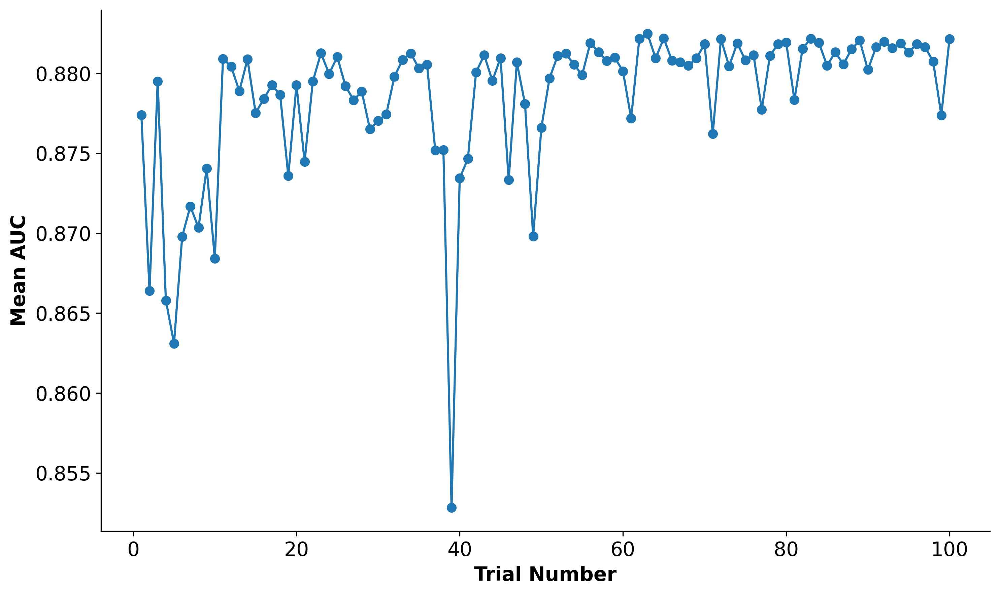

In [84]:
import json

# Save the best parameters
with open("best_params.json", "w") as f:
    json.dump(best_params, f)

# Save the AUC scores
auc_df = pd.DataFrame({
    'Trial': range(1, len(results_optuna) + 1),
    'Mean AUC': results_optuna})
#    'Params': params_optuna
#})
auc_df.to_csv("optuna_auc_scores.csv", index=False)

#print("Best model, parameters, and AUC scores have been saved.")
# Plot the trial number vs mean AUC
plt.figure(figsize=(10, 6))
plt.plot(range(1, len(results_optuna) + 1), results_optuna, marker='o', linestyle='-')
plt.xlabel('Trial Number', fontsize=14, fontweight='bold')
plt.ylabel('Mean AUC', fontsize=14, fontweight='bold')

# Optionally, set x and y ticks fontsize
plt.xticks(fontsize=14)
plt.yticks(fontsize=14)

#plt.title('Optuna Optimization: Trial vs Mean AUC')
#plt.grid(True)

plt.tight_layout()
plt.savefig('optuna_optimization_trial_vs_mean_auc.png', dpi=300, bbox_inches='tight')

sns.despine()

# Show the figure
plt.show()

In [34]:
from sklearn.metrics import roc_auc_score, roc_curve, auc
def evaluate_xgboost_model(X_train, X_test, y_train, y_test, xg_best_trial_params):
    final_xg_model = XGBClassifier(**best_params)
    final_xg_model.fit(X_train, y_train)
    
    # Predict classes
    y_pred_train = final_xg_model.predict(X_train)
    y_pred_test = final_xg_model.predict(X_test)
    
    # Calculate accuracy on training and test sets
    train_accuracy = accuracy_score(y_train, y_pred_train)
    test_accuracy = accuracy_score(y_test, y_pred_test)

    # Save the trained model
    joblib.dump(final_xg_model, "best_xgb_model.NEW.combined.feature22.joblib")
    
    return final_xg_model, test_accuracy, y_pred_test

def plot_roc_with_ci(model, X_test, y_test, n_bootstraps=1000, seed=42):
    # Compute the ROC curve and AUC for the original data
    y_pred_proba = model.predict_proba(X_test)[:, 1]
    fpr, tpr, _ = roc_curve(y_test, y_pred_proba)
    roc_auc = auc(fpr, tpr)
    
    # Initialize variables for bootstrapping
    rng = np.random.RandomState(seed)
    bootstrapped_scores = []
    tprs = []
    mean_fpr = np.linspace(0, 1, 100)
    
    for i in range(n_bootstraps):
        # Bootstrap sample
        indices = rng.randint(0, len(X_test), len(X_test))
        if len(np.unique(y_test[indices])) < 2:
            continue
        
        y_pred_proba_boot = model.predict_proba(X_test[indices])[:, 1]
        fpr_boot, tpr_boot, _ = roc_curve(y_test[indices], y_pred_proba_boot)
        tprs.append(np.interp(mean_fpr, fpr_boot, tpr_boot))
        tprs[-1][0] = 0.0
        bootstrapped_scores.append(auc(fpr_boot, tpr_boot))
    
    # Calculate mean and std of the tprs
    tprs = np.array(tprs)
    mean_tpr = tprs.mean(axis=0)
    std_tpr = tprs.std(axis=0)
    
    # Calculate the mean and std for AUC
    mean_auc = np.mean(bootstrapped_scores)
    std_auc = np.std(bootstrapped_scores)
    
    # Plot the ROC curve
    plt.figure(figsize=(10, 6))
    plt.plot(fpr, tpr, color='b', lw=2, label='ROC curve (area = {:.2f} ± {:.2f})'.format(roc_auc, std_auc))
    plt.fill_between(mean_fpr, mean_tpr - std_tpr, mean_tpr + std_tpr, color='grey', alpha=0.2)
    plt.plot([0, 1], [0, 1], 'k--', lw=2)
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate', fontsize=14, fontweight='bold')
    plt.ylabel('True Positive Rate', fontsize=14, fontweight='bold')
    plt.title('Receiver Operating Characteristic with CI', fontsize=14, fontweight='bold')
    plt.legend(loc="lower right")
    plt.tight_layout()
    sns.despine()
    plt.savefig('final_roc_curve_with_ci.png', dpi=300)
    plt.show()




{'max_depth': 33, 'n_estimators': 859, 'colsample_bytree': 0.6507311870884709, 'min_child_weight': 250, 'subsample': 0.8863762197186681, 'learning_rate': 0.14265404106051022, 'gamma': 0.21851104057571344, 'reg_alpha': 0.0001807461644054961, 'reg_lambda': 2.7446935116514343e-10}


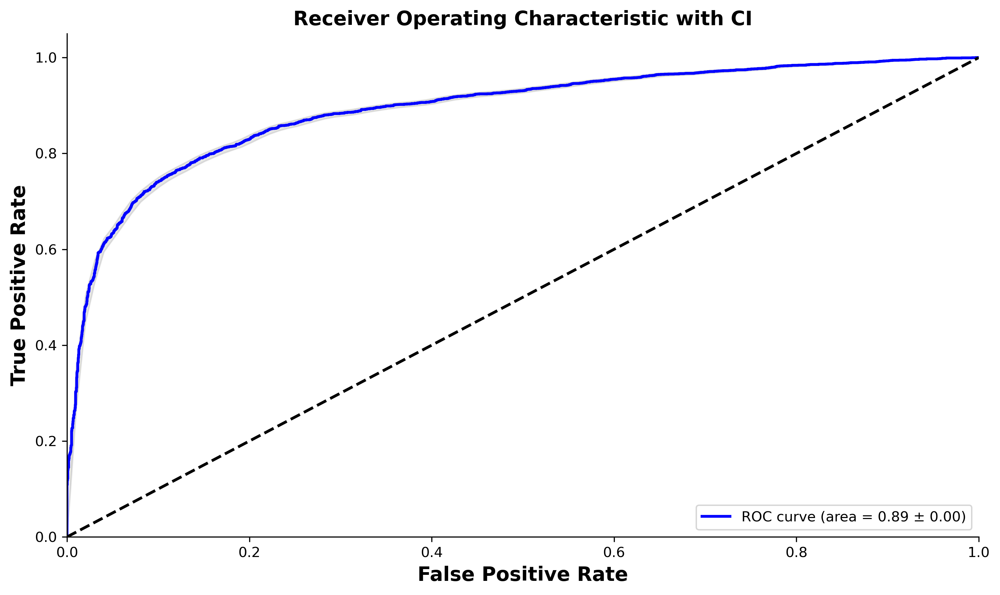

In [38]:
with open("best_params.json", 'r') as file:
    best_params = json.load(file)

# Print the loaded parameters to verify
print(best_params)
final_xg_model, test_accuracy, y_pred_test = evaluate_xgboost_model(X_combined_train, X_combined_test, y_combined_train, y_combined_test, best_params)
plot_roc_with_ci(final_xg_model, X_combined_test, y_combined_test)
# Create a SHAP explainer object
# Create a SHAP explainer object using TreeExplainer
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# Assuming `final_xg_model` and `y_combined_test` are already defined
# Make predictions on the test data
y_pred = final_xg_model.predict(X_combined_test)

# Generate the confusion matrix
cm = confusion_matrix(y_combined_test, y_pred)

# Plot the confusion matrix using seaborn


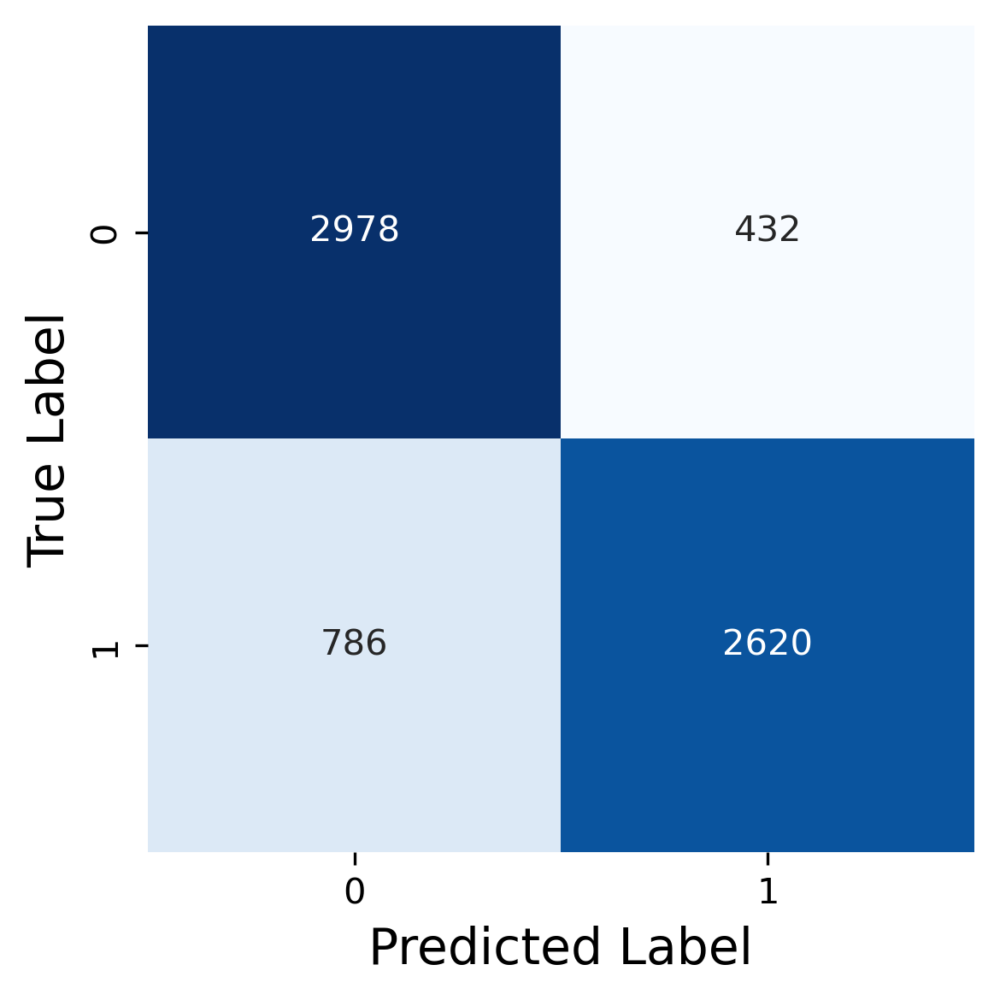

0.8213028169014085

In [39]:
plt.figure(figsize=(4, 4))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', cbar=False, 
            xticklabels=np.unique(y_combined_test), yticklabels=np.unique(y_combined_test))
plt.xlabel('Predicted Label', fontsize=14)
plt.ylabel('True Label', fontsize=14)
#plt.title('Confusion Matrix', fontsize=16)
plt.tight_layout()
plt.savefig('confusion_matrix.png', dpi=300)
plt.show()
test_accuracy

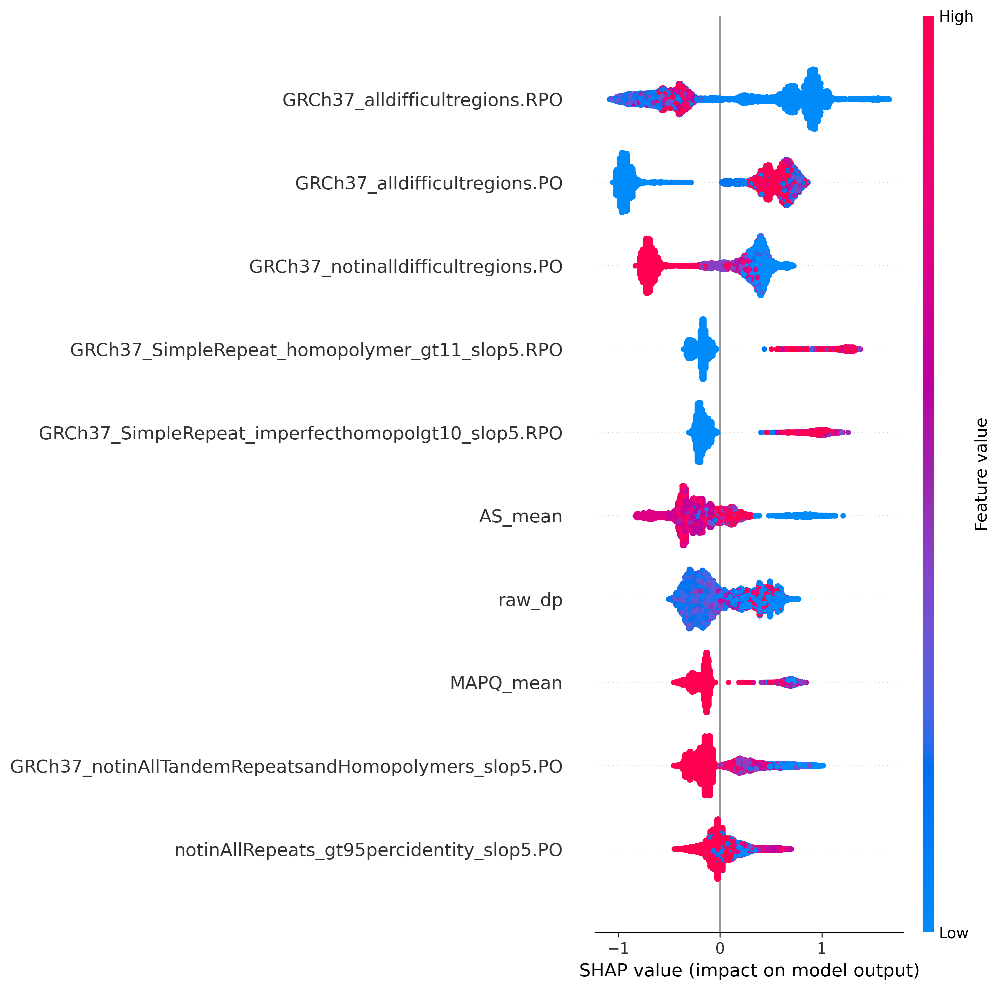

In [40]:
import shap
explainer = shap.TreeExplainer(final_xg_model)

# Compute SHAP values for the test set
shap_values = explainer.shap_values(X)
feature_names = data_filtered_removed_df.columns

fig = shap.summary_plot(shap_values, X, plot_type='dot', plot_size=(10, 10),
                  feature_names=feature_names, max_display=10, color=plt.get_cmap("tab10"))
#plt.tight_layout()
#sns.despine()
#plt.savefig('feature_importance.shap.png', dpi=400, bbox_inches='tight')
fig, ax = plt.subplots(figsize=(10, 10))
shap.summary_plot(shap_values, X, plot_type='dot', feature_names=feature_names, max_display=10, color=plt.get_cmap("tab10"), show=False)
plt.tight_layout()
sns.despine()

# Save the plot
plt.savefig('feature_importance.shap.png', dpi=400, bbox_inches='tight')
plt.close(fig)

In [41]:
model_anno_df = pd.read_csv("model_probe_gene.bed", sep='\t', header=None)
model_anno_df.columns=['CHROM', "START", "STOP", "GENE"]
model_anno_df['probe'] = model_anno_df['CHROM'] + "_" + model_anno_df['START'].astype(str) + "_" + model_anno_df['STOP'].astype(str)
model_anno_df = model_anno_df[['probe', 'GENE']]
model_anno_df

#
shap_df = pd.DataFrame(shap_values, columns = feature_names)
shap_df.to_csv("shap_data_model.csv", index=None)

#shap_df
shap_df['Class'] = data_filtered_labels_df['labels']

shap_df['probe'] = data_train_df.probe
shap_df = pd.merge(shap_df, model_anno_df, on='probe', how='left')
#shap_df = shap_df.drop(['probe'], axis=1)
shap_df

,GRCh37_notinalldifficultregions.PO,refseq_union_cds.PO,GRCh37_notinAllTandemRepeatsandHomopolymers_slop5.PO,GRCh37_notinchainSelf_gt10kb.PO,GRCh37_notinlowmappabilityall.PO,GRCh37_segdups.PO,GRCh37_SimpleRepeat_homopolymer_4to6_slop5.RPO,GRCh37_SimpleRepeat_homopolymer_gt11_slop5.RPO,GRCh37_SimpleRepeat_imperfecthomopolgt10_slop5.RPO,hg19_self_chain_split_both_gt10k.PO,...,notinsegdupall.PO,AS_mean,GRCh37_alldifficultregions.PO,GRCh37_chainSelf_gt10kb.PO,GRCh37_alldifficultregions.RPO,MAPQ_mean,raw_dp,Class,probe,GENE
0,-0.722178,0.003355,-0.113212,-0.109710,-0.023989,0.042142,0.055174,-0.149945,-0.208822,-0.017939,...,0.052724,0.147014,-0.917982,-0.001158,0.926648,-0.111029,-0.265650,0,chr10_100017363_100017483,LOXL4
1,0.095938,0.012993,0.216045,-0.112217,-0.064261,0.011361,0.020234,-0.254292,-0.110035,-0.023184,...,-0.040072,-0.233145,0.631561,-0.024874,-0.649403,-0.248089,0.439016,1,chr10_100018755_100018875,LOXL4
2,0.269925,0.302565,-0.245726,-0.031467,-0.081686,-0.046075,-0.008426,-0.268494,-0.261408,-0.056620,...,0.027105,-0.231649,0.585079,0.015286,-0.655133,-0.292352,-0.258616,0,chr10_100144755_100144875,PYROXD2
3,-0.724189,0.081748,-0.152875,-0.120410,-0.087737,0.072872,-0.027168,-0.174555,-0.209226,-0.051870,...,0.058116,-0.358569,-0.972126,-0.010758,0.961518,-0.128357,-0.134091,0,chr10_100146950_100147070,PYROXD2
4,-0.726058,0.128282,-0.150733,-0.119190,-0.078457,0.083011,-0.048778,-0.163819,-0.224651,-0.051789,...,0.051258,-0.543330,-0.953750,-0.007079,0.885951,-0.140695,-0.251420,0,chr10_100148067_100148187,PYROXD2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11765,-0.741602,-0.069220,-0.180028,-0.108806,-0.080039,0.057143,0.091765,-0.180560,-0.215569,-0.023719,...,0.031593,-0.815615,-0.976713,-0.011362,0.941663,-0.115814,-0.389077,0,chr16_84070405_84070525,SLC38A8
11766,0.387728,0.316842,-0.238544,-0.046474,-0.099920,-0.005137,-0.188261,-0.293679,-0.202804,-0.041422,...,0.053674,-0.339527,0.555018,0.019068,-0.813256,-0.301427,-0.163811,0,chr16_840716_840836,.
11767,0.387728,0.316842,-0.238544,-0.046474,-0.099920,-0.005137,-0.188261,-0.293679,-0.202804,-0.041422,...,0.053674,-0.339527,0.555018,0.019068,-0.813256,-0.301427,-0.163811,0,chr16_840716_840836,CHTF18
11768,-0.719130,0.129144,-0.166355,-0.107585,-0.091124,0.077680,-0.196735,-0.162335,-0.170347,-0.025984,...,0.043425,-0.327629,-0.919792,-0.001090,0.851758,-0.123167,0.164270,0,chr16_84075548_84075668,SLC38A8


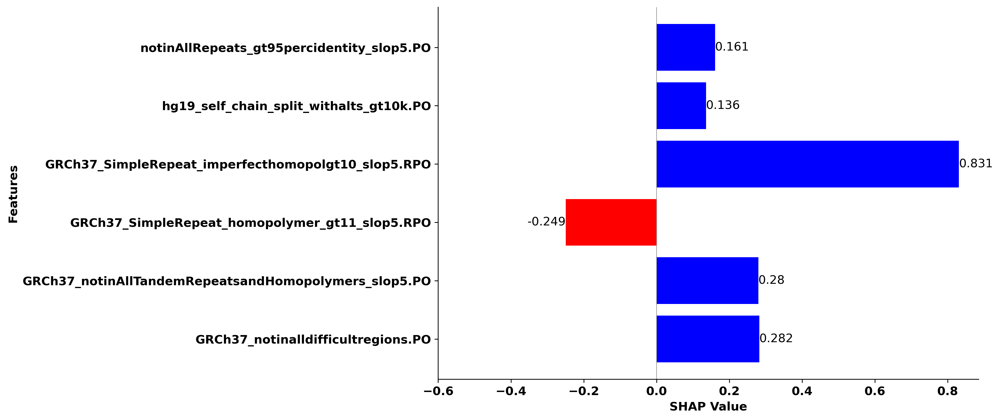

In [66]:
#PKD1 Exon 46

genes_of_interest = ['ABCD1','PKD1', 'PMS2', 'STRC', "MYH7"]
shap_GOI_df = shap_df[shap_df['GENE'].isin(genes_of_interest)]
shap_GOI_df = shap_GOI_df.reset_index(drop=True)
pkd1_ex46_data = pd.DataFrame(shap_GOI_df.iloc[5][:16])
pkd1_ex46_data_df = pd.DataFrame(pkd1_ex46_data)
pkd1_ex46_data_df = pkd1_ex46_data_df.reset_index()
pkd1_ex46_data_df.columns = ['Features', 'SHAP values']
pkd1_ex46_data_df =pkd1_ex46_data_df[pkd1_ex46_data_df['SHAP values'].abs() > 0.1]

plt.figure(figsize=(14, 6))
bars = plt.barh(pkd1_ex46_data_df['Features'], pkd1_ex46_data_df['SHAP values'], color=['blue' if value >= 0 else 'red' for value in pkd1_ex46_data_df['SHAP values']])
plt.ylabel('Features', fontsize=12, fontweight='bold')
plt.xlabel('SHAP Value', fontsize=12, fontweight='bold')
plt.xticks(ticks=np.arange(-0.6, 0.9, 0.2), fontsize=18, fontweight='bold')
#plt.title('SHAP Values for Features', fontsize=14)
plt.yticks(fontsize=12, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.axvline(0, color='gray', linewidth=0.5)  # Add a vertical line at x=0 for reference

# Add value labels to the bars
for bar in bars:
    xval = bar.get_width()
    plt.text(xval, bar.get_y() + bar.get_height() / 2, round(xval, 3), va='center', ha='left' if xval > 0 else 'right', fontsize=12)

plt.tight_layout()
sns.despine()
plt.savefig('SHAP_feature_importance_PKD1_exon46.png', dpi=300)
plt.show()



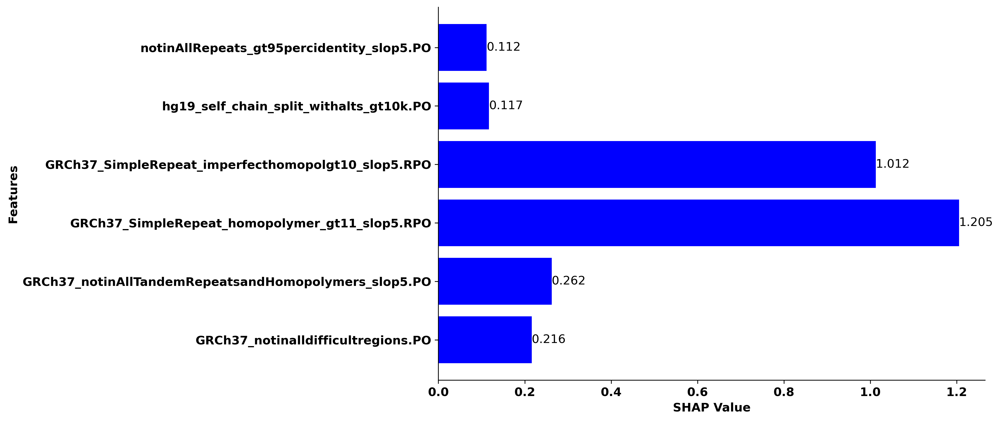

In [67]:

shap_GOI_PKD1_ex23_df = pd.DataFrame(shap_GOI_df.iloc[6][:16])
shap_GOI_PKD1_ex23_df = shap_GOI_PKD1_ex23_df.reset_index()
shap_GOI_PKD1_ex23_df.columns = ['Features', 'SHAP Values']

shap_GOI_PKD1_ex23_df =shap_GOI_PKD1_ex23_df[shap_GOI_PKD1_ex23_df['SHAP Values'].abs() > 0.1]
plt.figure(figsize=(14, 6))
#bars = plt.bar(shap_GOI_PKD1_ex23_df['Features'], shap_GOI_PKD1_ex23_df['SHAP Values'], color=['blue' if value >= 0 else 'red' for value in shap_GOI_PKD1_ex23_df['SHAP Values']])
bars = plt.barh(shap_GOI_PKD1_ex23_df['Features'], shap_GOI_PKD1_ex23_df['SHAP Values'], color=['blue' if value >= 0 else 'red' for value in shap_GOI_PKD1_ex23_df['SHAP Values']])
plt.ylabel('Features', fontsize=12, fontweight='bold')
plt.xlabel('SHAP Value', fontsize=12, fontweight='bold')
plt.xticks(fontsize=12, fontweight='bold')
plt.yticks(fontsize=12, fontweight='bold')
plt.axvline(0, color='gray', linewidth=0.5)  

# Add value labels to the bars
for bar in bars:
    xval = bar.get_width()
    plt.text(xval, bar.get_y() + bar.get_height() / 2, round(xval, 3), va='center', ha='left' if xval > 0 else 'right', fontsize=12)

plt.tight_layout()
sns.despine()
plt.savefig('SHAP_feature_importance_PKD1_ex23.png', dpi=300)
plt.show()


In [119]:
data_test_cols_df = valid_data_df[final_features]
data_test_cols_df = data_test_cols_df.fillna(0)
X_test2_scaled = scaler.transform(data_test_cols_df)
X_test2_scaled
loaded_model = joblib.load("best_xgb_model.NEW.combined.feature21.joblib")
predictions = loaded_model.predict(X_test2_scaled).tolist()
pred_probabilities = loaded_model.predict_proba(X_test2_scaled).tolist()
valid_data_df['prob_pred_1'] = [prob[1] for prob in pred_probabilities]
valid_data_df['prob_pred_0'] = [prob[0] for prob in pred_probabilities]
valid_data_df['prediction'] = predictions
#valid_data_df.prediction.value_counts()
valid_data_df.to_csv('SangerVariants_VerSamples_IDTProbes.400data.resutls.newmodel.csv', index=None)
valid_data_df.prediction.value_counts()
data_test_cols_df

/projects/wangc/rohan/miniconda3/envs/thesis/lib/python3.9/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


,GRCh37_notinalldifficultregions.PO,refseq_union_cds.PO,GRCh37_notinAllTandemRepeatsandHomopolymers_slop5.PO,GRCh37_notinchainSelf_gt10kb.PO,GRCh37_notinlowmappabilityall.PO,GRCh37_segdups.PO,GRCh37_SimpleRepeat_homopolymer_4to6_slop5.RPO,GRCh37_SimpleRepeat_homopolymer_gt11_slop5.RPO,GRCh37_SimpleRepeat_imperfecthomopolgt10_slop5.RPO,hg19_self_chain_split_both_gt10k.PO,...,human_g1k_v37_gemmap_l250_m1_e0_nonuniq.PO,lowmappabilityall.PO,notinAllRepeats_gt95percidentity_slop5.PO,notinsegdupall.PO,AS_mean,GRCh37_alldifficultregions.PO,GRCh37_chainSelf_gt10kb.PO,GRCh37_alldifficultregions.RPO,MAPQ_mean,raw_dp
0,0.000,0.567,1.000,0.0,1.000,1.0,0.000,0.0,0.0,1.0,...,0.0,0.000,1.000,0.0,143.083744,1.000,1.0,0.003,59.921182,406
1,0.000,0.642,1.000,0.0,1.000,1.0,1.000,0.0,0.0,1.0,...,0.0,0.000,1.000,0.0,146.570312,1.000,1.0,0.003,60.000000,384
2,0.000,0.000,1.000,0.0,0.725,1.0,0.000,0.0,0.0,1.0,...,0.0,0.683,0.417,0.0,146.222420,1.000,1.0,0.001,59.482206,562
3,0.000,0.000,0.429,0.0,0.000,1.0,1.000,0.0,0.0,1.0,...,0.0,1.000,0.429,0.0,143.069980,1.000,1.0,0.001,49.956389,986
4,0.000,0.000,1.000,0.0,0.283,1.0,1.000,0.0,0.0,1.0,...,0.0,0.933,1.000,0.0,145.588727,1.000,1.0,0.001,50.991649,479
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
435,0.000,1.000,0.658,1.0,1.000,0.0,0.711,0.0,0.0,0.0,...,0.0,0.000,1.000,1.0,144.799427,1.000,0.0,0.120,60.000000,349
436,1.000,0.000,1.000,1.0,1.000,0.0,1.000,0.0,0.0,0.0,...,0.0,0.000,1.000,1.0,146.879227,0.000,0.0,0.000,60.000000,207
437,1.000,0.000,1.000,1.0,1.000,0.0,1.000,0.0,0.0,0.0,...,0.0,0.000,1.000,1.0,142.404120,0.000,0.0,0.000,59.879556,631
438,0.183,0.000,0.933,1.0,1.000,0.0,0.700,0.0,0.0,0.0,...,0.0,0.000,1.000,1.0,145.965087,0.408,0.0,0.080,60.000000,802


In [116]:
column_list = valid_data_df.columns.tolist()
with open('input_data.column.ordered.list', 'w+') as fout:
    for i in column_list:
        fout.write(i + '\n')
        

In [123]:
model_column_list = data_filtered_df.columns.tolist()
with open('model_column.ordered.list', 'w+') as fout:
    for i in model_column_list:
        fout.write(i + '\n')

In [124]:
scaler_path = ('model_scaler.pkl')
joblib.dump(scaler, scaler_path)

['model_scaler.pkl']

In [125]:
data_apply_pred_df = data_apply_df[final_features]
x_data_hg002_all = scaler.transform(data_apply_pred_df)
x_data_hg002_all
loaded_model = joblib.load("best_xgb_model.NEW.combined.feature22.joblib")
predictions = loaded_model.predict(x_data_hg002_all).tolist()
pred_probabilities = loaded_model.predict_proba(x_data_hg002_all).tolist()
data_apply_df['prob_pred_1'] = [prob[1] for prob in pred_probabilities]
data_apply_df['prob_pred_0'] = [prob[0] for prob in pred_probabilities]
data_apply_df['prediction'] = predictions


/projects/wangc/rohan/miniconda3/envs/thesis/lib/python3.9/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but MinMaxScaler was fitted without feature names
  warnings.warn(


In [126]:
data_apply_df.to_csv("HG002_all_nonmutations_predictions.HPO.csv", index=False)

In [129]:
X_combined_test

array([[0.192     , 0.        , 0.375     , ..., 0.203     , 1.        ,
        0.01212349],
       [0.        , 0.        , 0.9       , ..., 0.083     , 1.        ,
        0.01071117],
       [0.        , 0.        , 0.354     , ..., 0.001     , 1.        ,
        0.0204852 ],
       ...,
       [0.00734574, 0.56082535, 0.40937328, ..., 0.0890326 , 0.986879  ,
        0.05517102],
       [0.1369478 , 0.92103736, 0.04108557, ..., 0.15586538, 0.98812113,
        0.03026125],
       [0.97751809, 0.08029404, 0.97497326, ..., 0.03583844, 0.9897252 ,
        0.05553678]])

In [138]:
data_only_df#.index(test_indices)
#data_train_df

,proper_pair_median,proper_pair_max,MAPQ_mean,MAPQ_std,MAPQ_min,MAPQ_median,MAPQ_max,AS_mean,AS_std,AS_min,...,SimpleRepeat_quadTR_11to50.RPO,SimpleRepeat_quadTR_51to200.PO,SimpleRepeat_quadTR_51to200.RPO,SimpleRepeat_triTR_11to50.PO,SimpleRepeat_triTR_11to50.RPO,SimpleRepeat_triTR_51to200.PO,SimpleRepeat_triTR_51to200.RPO,siren_similarRegions_dist1.PO,siren_similarRegions_dist1.RPO,Class
0,1.0,1.0,60.0,0.0,60.0,60.0,60.0,141.833333,1.443376,141.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
1,1.0,1.0,60.0,0.0,60.0,60.0,60.0,146.000000,0.000000,146.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
2,1.0,1.0,60.0,0.0,60.0,60.0,60.0,146.000000,0.000000,146.0,...,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
3,1.0,1.0,60.0,0.0,60.0,60.0,60.0,151.000000,0.000000,151.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
4,1.0,1.0,60.0,0.0,60.0,60.0,60.0,148.666667,2.516611,146.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11355,1.0,1.0,60.0,0.0,60.0,60.0,60.0,151.000000,0.000000,151.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1
11356,1.0,1.0,60.0,0.0,60.0,60.0,60.0,147.666667,2.886751,146.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
11357,1.0,1.0,60.0,0.0,60.0,60.0,60.0,145.666667,4.509250,141.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0
11358,1.0,1.0,60.0,0.0,60.0,60.0,60.0,151.000000,0.000000,151.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0


In [146]:
real_data_test_df = balanced_df.iloc[test_indices]

In [147]:
y_pred_real_test = y_pred_test[:3408]
real_data_test_df['ClinRay_prediction'] = y_pred_real_test

/tmp/ipykernel_696226/49210627.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  real_data_test_df['ClinRay_prediction'] = y_pred_real_test


In [151]:
real_data_test_df.to_csv("HG002_model_test_data_predictions.csv", index=False)